<a href="https://colab.research.google.com/github/nguyen084/MATH5670/blob/master/MATH5670_Group005_FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**MATH 5670: Final Project: Stock Forecasting**

**Hieu Nguyen, Sai Teja Manchala**

**Fall 2019**

Hieu Nguyen is a Computer Science Ph.D. student at UCONN. His focus is in forecasting and machine learning methods. Prior attending UCONN, he obtained BA and MA in Mathematics with a minor in Economics, and he had done various research projects related to steganography, price optimization, economic analysis, and computer vision. 

![alt text](https://media.licdn.com/dms/image/C5103AQH2Iw3QkQqBEg/profile-displayphoto-shrink_200_200/0?e=1579737600&v=beta&t=Iug-0d6Wl3Y7pUww8BqR8J4B3Zb3gbAerDxFOrllxlc)



Sai Teja Manchala is a Electrical Engineering Ph.D. student at UCONN. His research focus is on Cybernetics. Prior to attending UCONN, he worked as a System Design Engineer at Lunewave,Inc in Tucson,Arizona and as an Electrical Engineer at Electrosonix,LC in Tucson,AZ. He obtained his BSEE from Wright State University,Dayton,Ohio in 2017 with a focus on Radar Systems and Electronics.  

![alt text](https://media.licdn.com/dms/image/C4D03AQEtOFEUZ3ebtw/profile-displayphoto-shrink_200_200/0?e=1579737600&v=beta&t=VlfDODZgxWPLt7Rwc6MFWSD-ilpyo_Xqp40aHgMRdJQ)



# Problem Description

The aim of this project is to forecast stocks 1-30 days in future using other related stocks. In the past, many researchers used ARIMA model and is the only one to predict the closing price of a stock in the near future. In this project, the idea is that stock in the similar sector that tends to move in a similar fashion, and with the hope of data avaiable, we can exploit and find stock's moving pattern. For example, Apple price might be influenced by other index prices such as Microsoft, Amazon, Tesla, etc...

To begin our project, we started with the traditional ARIMA model and continue with support vector machine methods. The outline of this project is as following:

I. ARIMA model with a daily price

II. ARIMA model with a daily relative change

III. Support Vector Regression

    1. Use previous prices to predict the next day price.

    2. Use previous prices to predict the price multiple days ahead

IV. Support Vector Classification

    1. Use previous stock changes to predict the next day change.
    2. Use previous stock changes to predict the change multiple days  ahead.

V. Comparision and Conclusion




# 0.Fetching Data
In this project, we use the list of a top tech company stock which contains around 200 tickers. Please see 'stocklist.txt' to see the avaiable tickers. The day range we used in here is from 01/01/2012 to 01/01/2019. Which is about 7 years worth of daily price data. 

Using the library yahoo_historical, we were able to fetch all the data from the 'stocklist.txt' and save the 'ClosePrice' of each stock into 'metastockprice.csv'.

We also compute the relative change in stock price $RelativeChange = \frac{P_t-P_{t-1}}{P_{t-1}}$ for each stock and save as 'metastockpercent.csv'.

In [1]:
#1. First we need to fetch some data from yahoo 
!pip install yahoo_historical &> /dev/null
import pandas as pd
from yahoo_historical import Fetcher
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import os
os.chdir(r'/content/gdrive/My Drive/Academic/UCONN/Financial Research/MATH5670/FinalProject/')

In [0]:
with open('stocklist.txt') as f:
    content = f.readlines()
content = [x.strip() for x in content]
count = 1
checkk = False

def CloseShift(stock,df,n):
    CS = pd.Series(df['0'+stock+'Close'].shift(n), name = str(-1*n)+stock+'Close')
    df = df.join(CS)
    return df

for stock in content:
    print(stock,count)
    count += 1
    data = Fetcher(stock, [2012,1,1], [2019,1,1])
    stockdata = data.getHistorical()
    df = pd.DataFrame(data=stockdata)
    df = df[['Date','Close']]
    #df['Close'] = df['Close'].pct_change()*100 this is for metastockpercent.csv
    df = df.fillna(0)
    df.columns = ['Date','0'+stock+'Close']
    if checkk is False:
        metadf = df
        checkk = True
    else:
        metadf = metadf.join(df[['0'+stock+'Close']])
    for i in range(1,30):
        df = CloseShift(stock,df,(-1*i))
        metadf = metadf.join(df.iloc[:,-1])
    df = df.dropna()
    df = df[:-30]
    if(df.shape[0] != 1701):
        print(stock,df.shape)
    # stockdir = 'StockData/'+stock+'.csv'
    # df.to_csv(stockdir, index = None, header=True) #Save individual stock as csv file
#metastockdir = 'metastockpercent.csv'
metastockdir = 'metastockprice.csv'
metadf.to_csv(metastockdir, index=None,header=True)
#Since I already ran this code before and had both of the csv files, I won't run it again, but instead load it

# I.ARIMA Model 1 (Autoregressive integrated moving average)

In previous research, ARIMA model was well-known for time series analysis. Thus, we can try to run a sample ARIMA model with APPL ticker.
The ARIMA model can be viewed as a "cascade" of two models. One is non-stationary and the another is a wide-sense stationary. In this problem, we assume the model to be as a wide-sense stationary:
$$\left(1-\sum_{i=1}^p\phi_iL^i\right)Y_t=\left(1+\sum_{i=1}^q\theta_iL^i\right)\epsilon_t$$
To process $Y_t$, use a generalization of the method of autoregressive forecasting.
$$Y_t = c + \sum_{i=1}^p\theta_iY_{t-i}+\epsilon_t$$
We do not get into an in-depth analysis of technical details. More information regarding the full details and proof could be found on Duke university(https://people.duke.edu/~rnau/411arim.htm)

As for the first model, we use a lag of 5 and use ARIMA(5,1,0) which is differenced as a first-order autoregressive model. If the errors of a random wak model are autocorrelated, then we can model by regressing the first diffrence of Y on itself is lagged by a period of 5. This would yield the following prediction equation:
$$Y_t - Y_{t-5} = \mu +\phi_1(Y_{t-1}-Y_{t-6})$$
In python, we can import the ARIMA model using statsmodels library, and the code is expressed as following:

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import lag_plot
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
AAPL_df = pd.read_csv("AAPL.csv")
print(AAPL_df.head(5))

         Date  0AAPLClose  1AAPLClose  ...  27AAPLClose  28AAPLClose  29AAPLClose
0  2012-01-03   58.747143   59.062859  ...    70.488571    71.800003    72.779999
1  2012-01-04   59.062859   59.718571  ...    71.800003    72.779999    71.095711
2  2012-01-05   59.718571   60.342857  ...    72.779999    71.095711    71.744286
3  2012-01-06   60.342857   60.247143  ...    71.095711    71.744286    71.731430
4  2012-01-09   60.247143   60.462856  ...    71.744286    71.731430    73.550003

[5 rows x 31 columns]


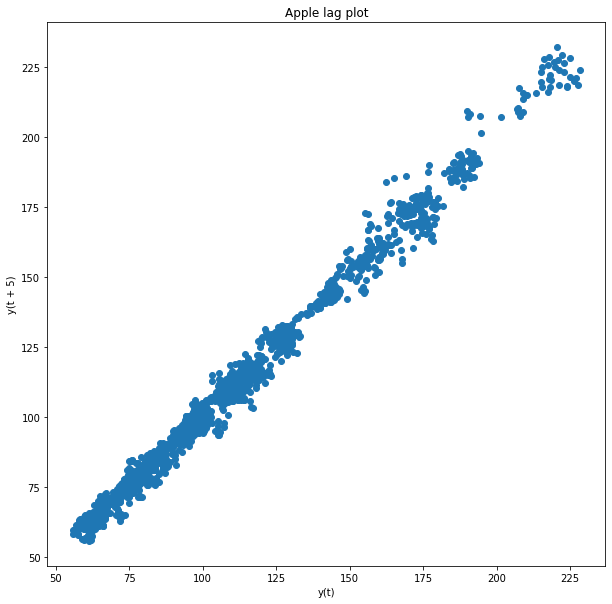

In [6]:
#Below is the plot of correlation plot of lag 5
plt.figure(figsize=(10,10))
lag_plot(AAPL_df['0AAPLClose'], lag=5)
plt.title('Apple lag plot')
plt.show()

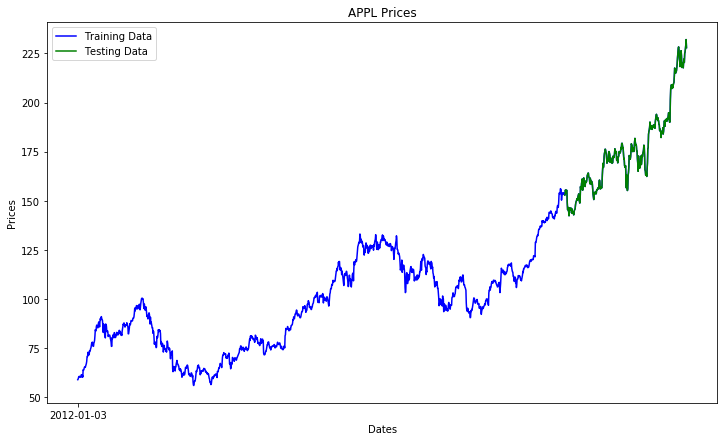

In [7]:
#Split train and test setsARIMA Remark:
train_data, test_data = AAPL_df[0:int(len(AAPL_df)*0.8)], AAPL_df[int(len(AAPL_df)*0.8):]
plt.figure(figsize=(12,7))
plt.title('APPL Prices')
plt.xlabel('Dates')
plt.ylabel('Prices')
plt.plot(AAPL_df['0AAPLClose'], 'blue', label='Training Data')
plt.plot(test_data['0AAPLClose'], 'green', label='Testing Data')
plt.xticks(np.arange(0,982, 1300), AAPL_df['Date'][0:982:1300])
plt.legend()

In [8]:
def smape_kun(y_true, y_pred):
    return np.mean((np.abs(y_pred - y_true) * 200/ (np.abs(y_pred) + np.abs(y_true))))
train_ar = train_data['0AAPLClose'].values
test_ar = test_data['0AAPLClose'].values
history = [x for x in train_ar]
predictions = list()
for t in range(len(test_ar)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test_ar[t]
    history.append(obs)
error = mean_squared_error(test_ar, predictions)
print('Testing Mean Squared Error: %.3f' % error)
error2 = smape_kun(test_ar, predictions)
print('Symmetric mean absolute percentage error: %.3f' % error2)

Testing Mean Squared Error: 5.509
Symmetric mean absolute percentage error: 13.107


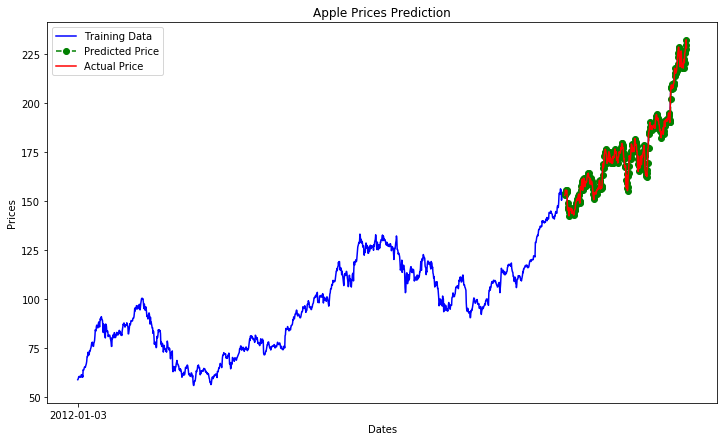

In [9]:
plt.figure(figsize=(12,7))
plt.plot(AAPL_df['0AAPLClose'], 'green', color='blue', label='Training Data')
plt.plot(test_data.index, predictions, color='green', marker='o', linestyle='dashed', 
         label='Predicted Price')
plt.plot(test_data.index, test_data['0AAPLClose'], color='red', label='Actual Price')
plt.title('Apple Prices Prediction')
plt.xlabel('Dates')
plt.ylabel('Prices')
plt.xticks(np.arange(0,982, 1300), AAPL_df['Date'][0:982:1300])
plt.legend()

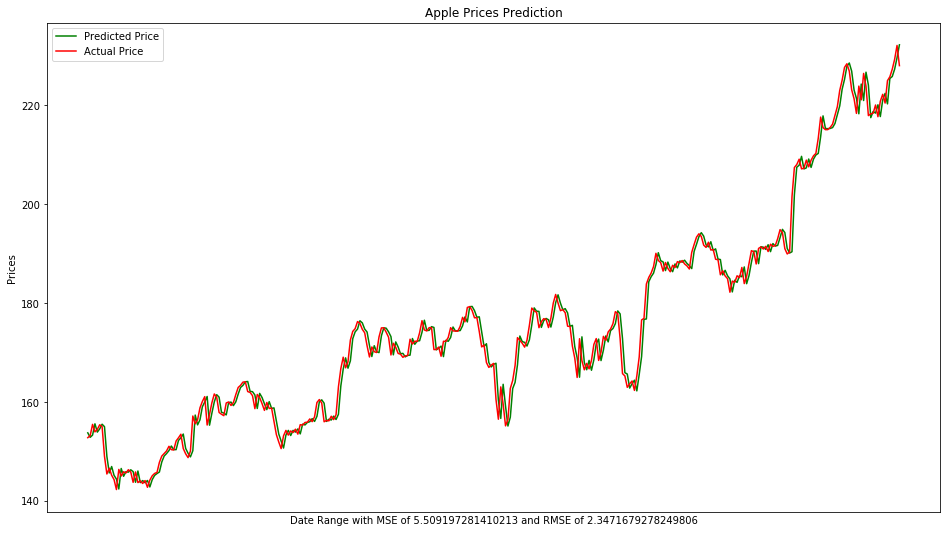

In [10]:
import math
plt.figure(figsize=(16,9))
plt.plot(test_data.index, predictions, color='green',label='Predicted Price')
plt.plot(test_data.index, test_data['0AAPLClose'], color='red', label='Actual Price')
plt.legend()
plt.title('Apple Prices Prediction')
plt.xlabel('Date Range with MSE of {} and RMSE of {}'.format(str(error),str(math.sqrt(error))))
plt.ylabel('Prices')
plt.xticks(np.arange(6386,982, 300), AAPL_df['Date'][6386:982:300])
plt.legend()

**ARIMA Remark:** After running ARIMA for a lag of 5, we achive an RMSE score of 2.34. However, one must be careful when they make a conclusion about the precision of this model. Even though the error is small, notice that the prediction price is the actual price of the previous day's price. This suggest that using MSE as the way to measure model accuracy is not suitable for evaluating non-stationary time series model.






# II. ARIMA Model 2:
Instead of using close price. we can try to use daily relative change.

         Date  0AAPLClose  1AAPLClose  ...  27AAPLClose  28AAPLClose  29AAPLClose
0  2012-01-03    0.000000    0.537415  ...     0.050691     1.860489     1.364897
1  2012-01-04    0.537415    1.110193  ...     1.860489     1.364897    -2.314218
2  2012-01-05    1.110193    1.045380  ...     1.364897    -2.314218     0.912256
3  2012-01-06    1.045380   -0.158617  ...    -2.314218     0.912256    -0.017919
4  2012-01-09   -0.158617    0.358047  ...     0.912256    -0.017919     2.535253

[5 rows x 31 columns]


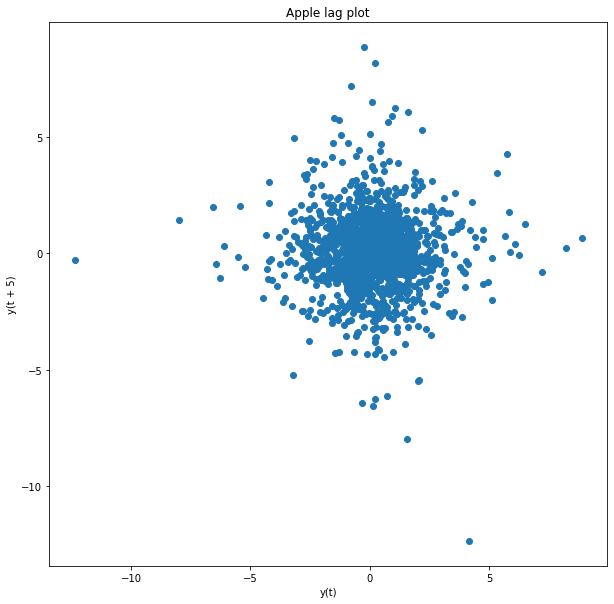

In [11]:
AAPL_percent_df = pd.read_csv("AAPL_percent.csv")
print(AAPL_percent_df.head(5))
#Below is the plot of correlation plot of lag 5
plt.figure(figsize=(10,10))
lag_plot(AAPL_percent_df['0AAPLClose'], lag=5)
plt.title('Apple lag plot')
plt.show()

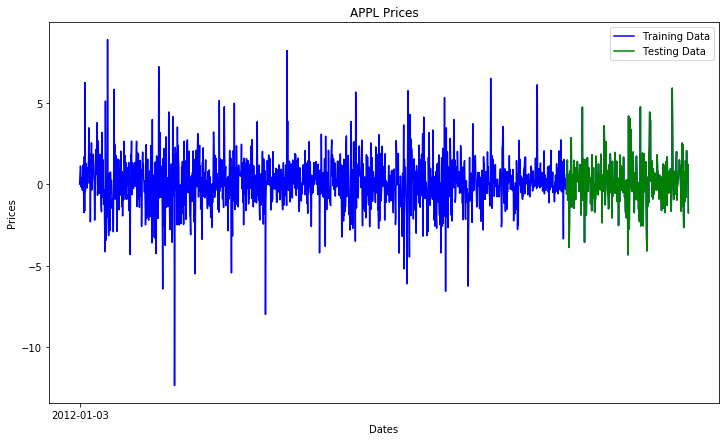

In [12]:
#Split train and test sets:
train_data, test_data = AAPL_percent_df[0:int(len(AAPL_percent_df)*0.8)], AAPL_percent_df[int(len(AAPL_percent_df)*0.8):]
plt.figure(figsize=(12,7))
plt.title('APPL Prices')
plt.xlabel('Dates')
plt.ylabel('Prices')
plt.plot(AAPL_percent_df['0AAPLClose'], 'blue', label='Training Data')
plt.plot(test_data['0AAPLClose'], 'green', label='Testing Data')
plt.xticks(np.arange(0,982, 1300), AAPL_percent_df['Date'][0:982:1300])
plt.legend()

In [13]:
train_ar = train_data['0AAPLClose'].values
test_ar = test_data['0AAPLClose'].values
history = [x for x in train_ar]
predictions = list()
for t in range(len(test_ar)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test_ar[t]
    history.append(obs)
    # if t%30 == 0 :
    #     print(t)
error = mean_squared_error(test_ar, predictions)
print('Testing Mean Squared Error: %.3f' % error)
error2 = smape_kun(test_ar, predictions)
print('Symmetric mean absolute percentage error: %.3f' % error2)

Testing Mean Squared Error: 2.128
Symmetric mean absolute percentage error: 149.276


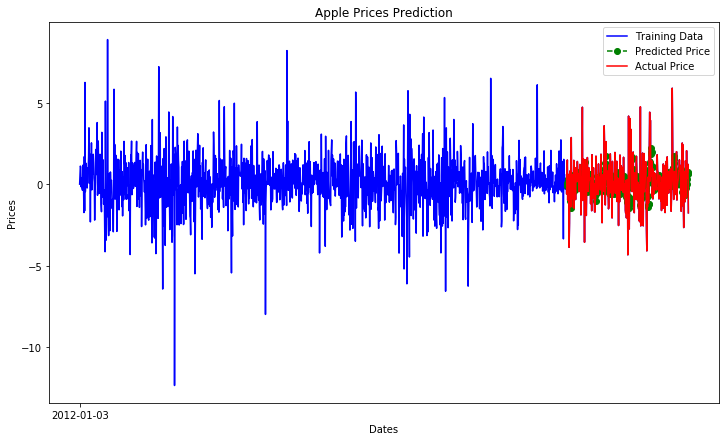

In [14]:
plt.figure(figsize=(12,7))
plt.plot(AAPL_percent_df['0AAPLClose'], 'green', color='blue', label='Training Data')
plt.plot(test_data.index, predictions, color='green', marker='o', linestyle='dashed', 
         label='Predicted Price')
plt.plot(test_data.index, test_data['0AAPLClose'], color='red', label='Actual Price')
plt.title('Apple Prices Prediction')
plt.xlabel('Dates')
plt.ylabel('Prices')
plt.xticks(np.arange(0,982, 1300), AAPL_percent_df['Date'][0:982:1300])
plt.legend()

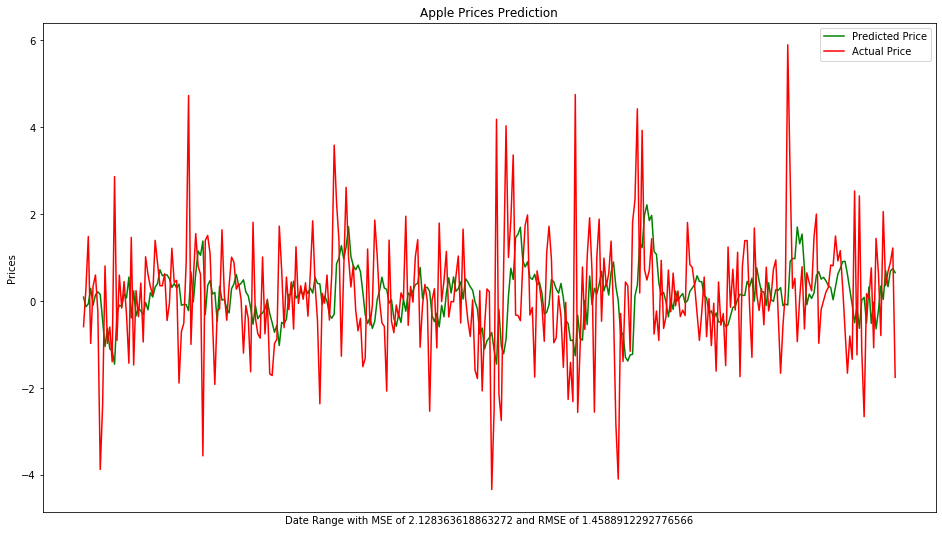

In [15]:
import math
plt.figure(figsize=(16,9))
plt.plot(test_data.index, predictions, color='green',label='Predicted Price')
plt.plot(test_data.index, test_data['0AAPLClose'], color='red', label='Actual Price')
plt.legend()
plt.title('Apple Prices Prediction')
plt.xlabel('Date Range with MSE of {} and RMSE of {}'.format(str(error),str(math.sqrt(error))))
plt.ylabel('Prices')
plt.xticks(np.arange(6386,982, 300), AAPL_percent_df['Date'][6386:982:300])
plt.legend()

From the plot above, it is hard to evaluate the model. Instead of measure the accuracy in the MSE fashion, we can try to evaluate the model in the binary way. We convert the data to binary code (Up or down) based on the relative change, and test to see whether the ARIMA model can predit the direction of AAPL stock.

In [0]:
test_data_binary = (test_data['0AAPLClose']).to_numpy()
test_data_binary = np.where(test_data_binary > 0, 1, 0)
predictions_binary = np.concatenate( predictions, axis=0 )
predictions_binary = np.where(predictions_binary > 0, 1, 0)

In [17]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(test_data_binary, predictions_binary))
print(classification_report(test_data_binary, predictions_binary))
accuracy = str(np.mean((predictions_binary == test_data_binary) * 100))
print('\nTesting Accuracy: ' + accuracy)
print('===============================')

[[ 64  93]
 [ 68 116]]
              precision    recall  f1-score   support

           0       0.48      0.41      0.44       157
           1       0.56      0.63      0.59       184

    accuracy                           0.53       341
   macro avg       0.52      0.52      0.52       341
weighted avg       0.52      0.53      0.52       341


Testing Accuracy: 52.78592375366569


***ARIMA Model 2 Remark: *** The result from arima model 2 is more realistic. As stock price moves in a bronwian motion and random, we can expect to have an accuracy rate of about 50%. To be realistic, it is difficult to predict stock market prices, and if one simple model can precisly predict it, everyone will start using it, and the market would then adjust itself.

One very interesting article discussing this phenomenial in timeseries forecasting by Vegard Flovik, The article can be read using this link:
https://towardsdatascience.com/how-not-to-use-machine-learning-for-time-series-forecasting-avoiding-the-pitfalls-19f9d7adf424

# III. Support Vector Regression
In this section, we can move to a more advanced statistical method. As describe in section I, we use other stock price as an independent variable and use them to predict the stock price. We take APPL stock as an example, so that, we can compare it to the ARIMA methods above.


## i)Use previous price to predict next day price
The general model is described as below:
$$P_t = f(Q_{1_{t-d}},Q_{2_{t-d}},Q_{3_{t-d}},Q_{4_{t-d}},Q_{5_{t-d}},...)$$
where $P$ is the stock to be predict, $Q$ are the related stocks and $d \in \{1,30\}$

In [0]:
# coding: utf-8
import pandas as pd
import os
import math
import numpy as np
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score,mean_squared_error

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def SVM_model(use_scale, use_PCA, stock, K):
    sc_S = StandardScaler()
    sc_t = StandardScaler()
    yc_S = StandardScaler()
    yc_t = StandardScaler()
    df = pd.read_csv("metastockprice.csv")
    df = df[:-30]
    df = df.fillna(0)
    #print(df.shape)
    with open('stocklist.txt') as f:
        content = f.readlines()
    content = [x.strip() for x in content]
    resultcol = ['Days']
    for stocky in ['AAPL']:
        resultcol.append(stocky)
    resultdf = pd.DataFrame(columns=resultcol)
    print('Start!!')
    MSE_list= []
    for day in range(29):
        datacolums = []
        resultlist = []
        maxstock = 0
        for stocky in stock:
            for stockx in content:
                for i in range(day+1):
                    nametmp = str(i)+str(stockx)+'Close'
                    datacolums.append(nametmp)
            datacolums.append(str(day + 1) + str(stocky) + 'Close')
            tmpdf = df[datacolums]
            #######SVM######
            print("Start SVM.......")
            x = tmpdf[tmpdf.columns[:-1]]
            y = tmpdf[tmpdf.columns[-1]]
            x_train, x_test, ytrain, ytest = train_test_split(x, y, test_size=0.2, shuffle=False)
            min_max_scaler = MinMaxScaler()
            x_train = min_max_scaler.fit_transform(x_train)
            x_test = min_max_scaler.transform(x_test)
            if use_scale == True:
              sc_S = sc_S.fit(x_train)
              x_train = sc_S.transform(x_train)
              x_test = sc_S.transform(x_test)
            if use_PCA == True:
              # pca = PCA(n_components=.90,svd_solver='full')
              pca = PCA(n_components=50)
              x_train = pca.fit_transform(x_train)
              x_test = pca.transform(x_test)
            regressor = SVR(kernel=K)
            regressor.fit(x_train,ytrain)
            pred_train = regressor.predict(x_train)
            pred = regressor.predict(x_test)
            MSE = mean_squared_error(ytest, pred)
            MSE_train = mean_squared_error(ytrain, pred_train)
            resultlist.append(math.sqrt(MSE))
            MSE_list.append(MSE)
            print('MSE_value',MSE)
            fig = plt.figure(figsize=(12, 9))
            fig.suptitle(
                '{} Stock Validate of {} '.format(stocky,y.name),
                fontsize=20)
            fig.suptitle(
                '{} Stock Validate of {}'.format(stocky,y.name),
                fontsize=20)
            plt.xlabel('Date Range with MSE of {} and RMSE of {}'.format(str(MSE),str(math.sqrt(MSE))), fontsize=18)
            plt.ylabel('Price', fontsize=16)
            plt.plot(pred, label='Predict')
            plt.plot(ytest.values, label='Actual')
            plt.legend(loc='upper left')
            plt.show()
            plt.close()
            datacolums = []
        resultdf.loc[day] = [str(day)] + resultlist
    # resultdf.to_csv('resultprice.csv')
    plt.scatter(range(1,len(MSE_list)+1), MSE_list)
    plt.xlabel('Days')
    plt.ylabel('MSE', fontsize=16)
    plt.show()

Start!!
Start SVM.......
MSE_value 153.78178734378992


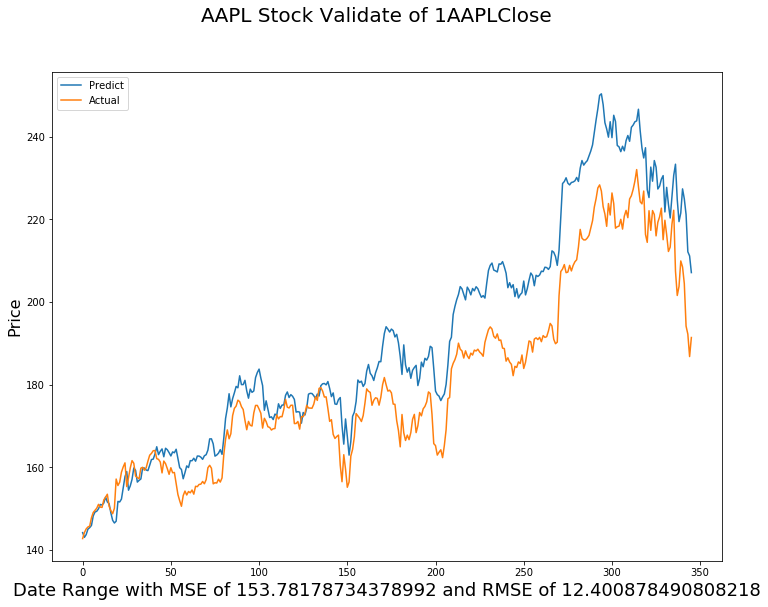

Start SVM.......
MSE_value 150.38248835593456


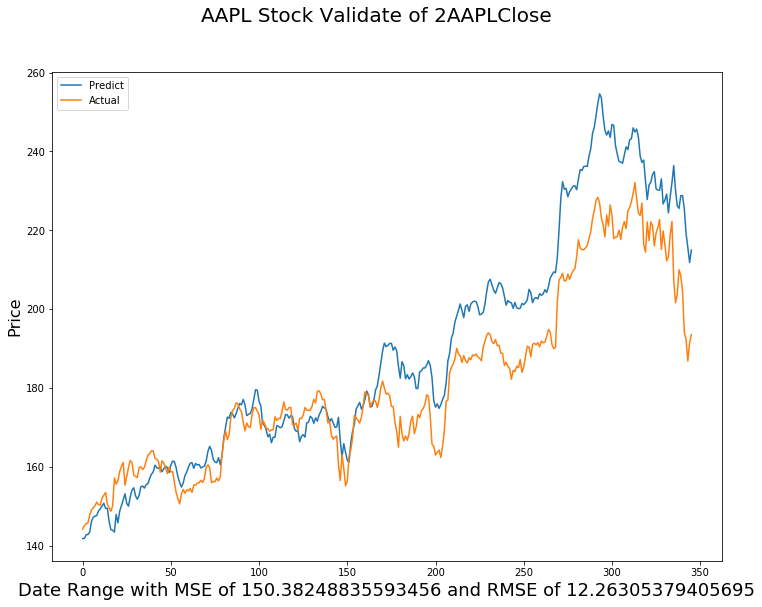

Start SVM.......
MSE_value 727.8444724583583


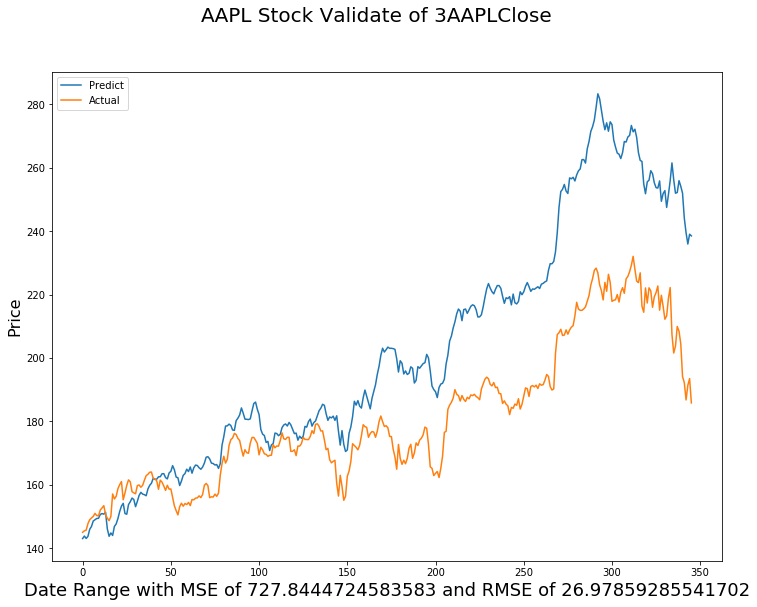

Start SVM.......
MSE_value 1062.632710584988


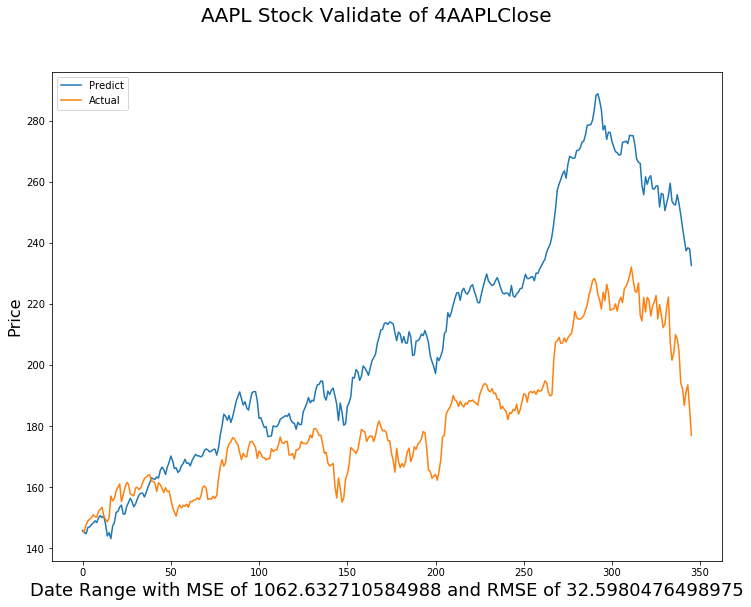

Start SVM.......
MSE_value 1742.7757473606155


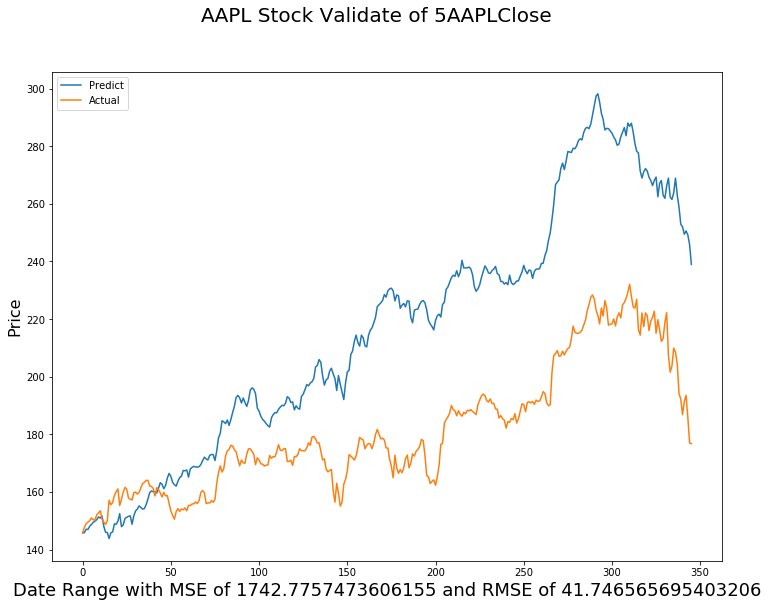

Start SVM.......
MSE_value 2492.590315309368


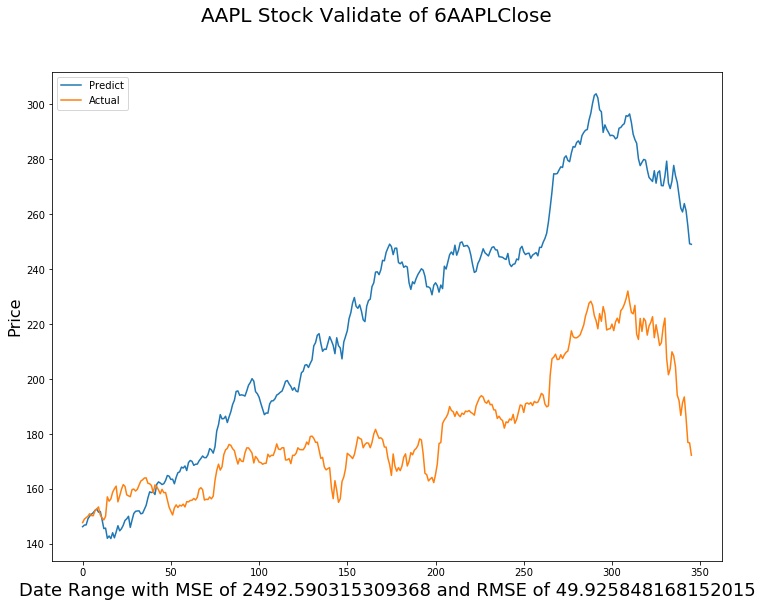

Start SVM.......
MSE_value 5752.352594526154


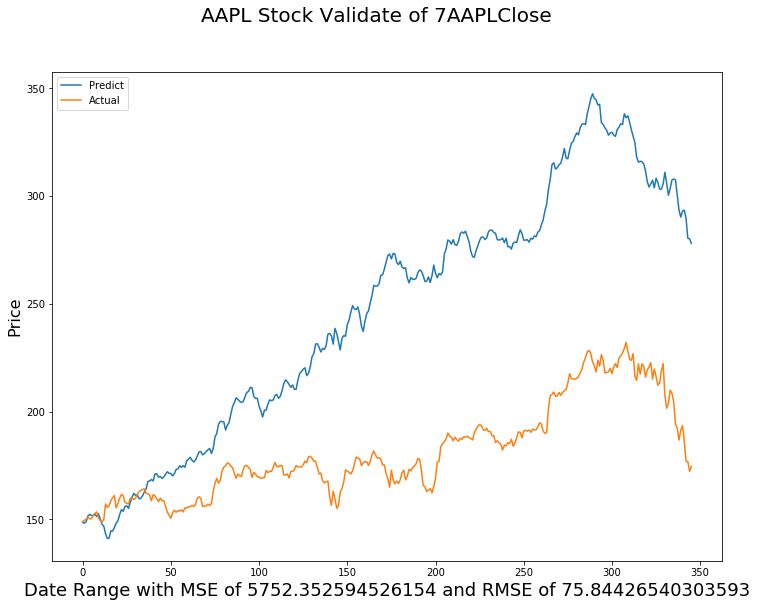

Start SVM.......
MSE_value 4462.437444834467


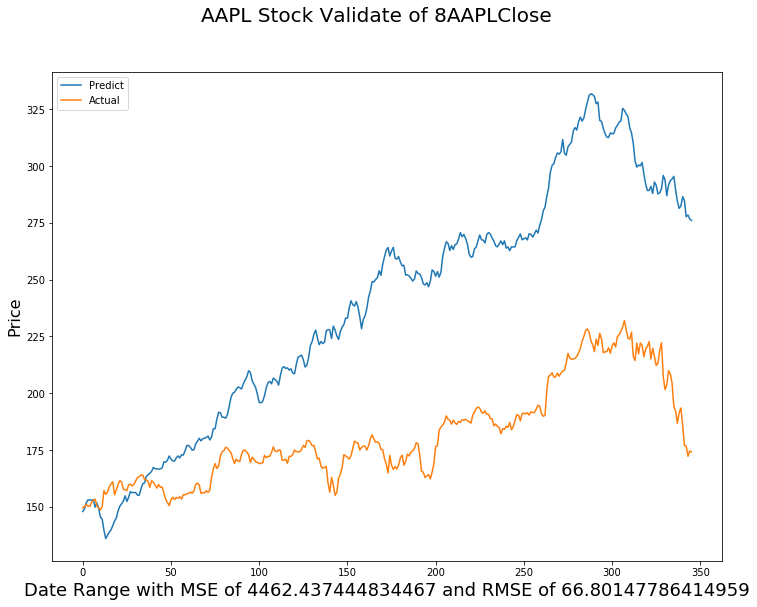

Start SVM.......
MSE_value 3808.463015954206


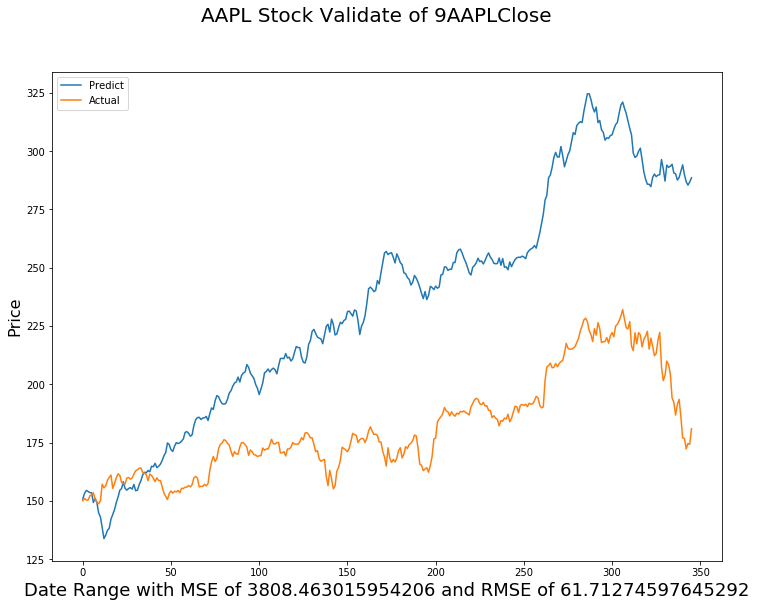

Start SVM.......
MSE_value 2572.3695174366644


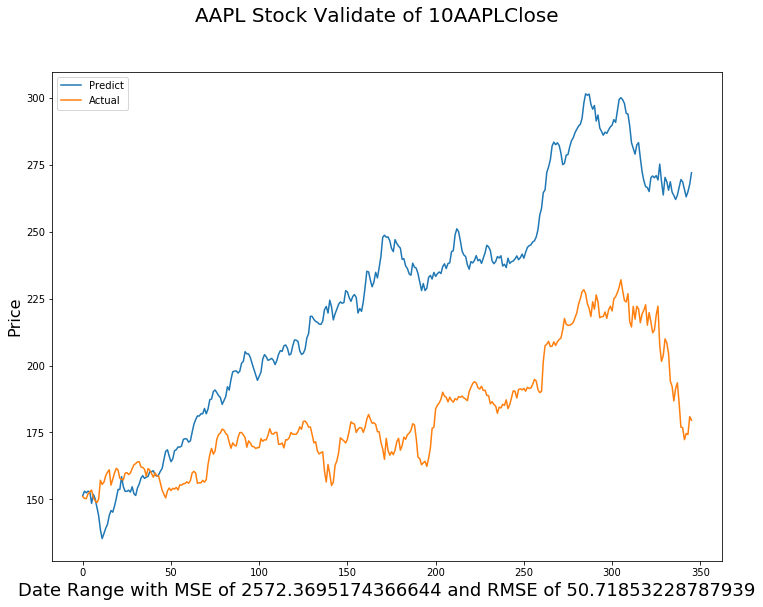

Start SVM.......
MSE_value 913.2217136190422


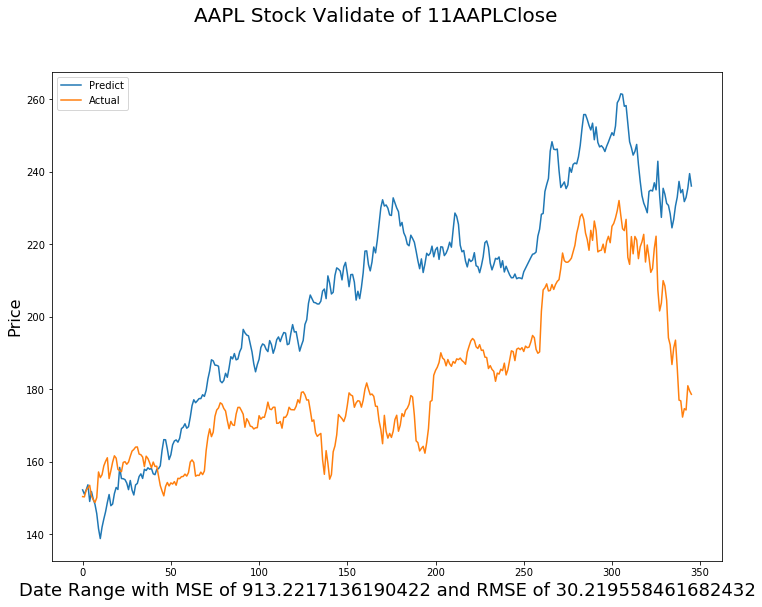

Start SVM.......
MSE_value 1249.3418275355482


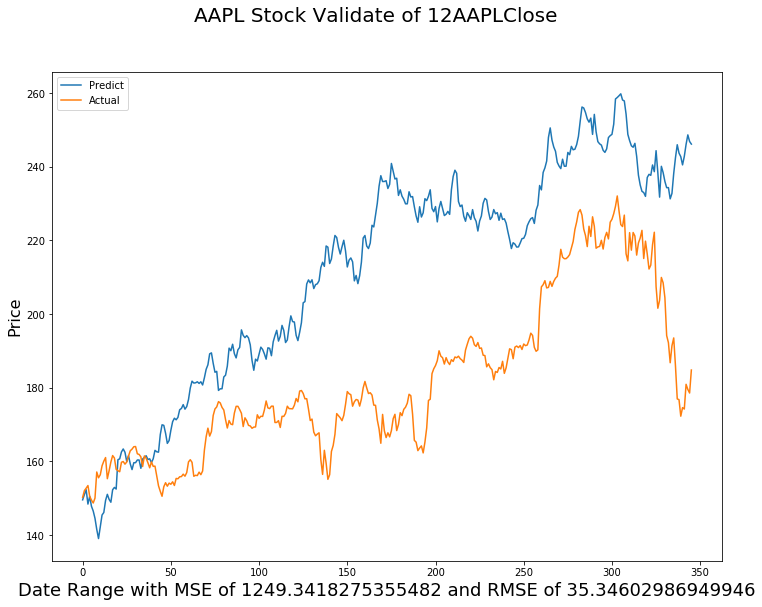

Start SVM.......
MSE_value 597.4815170504047


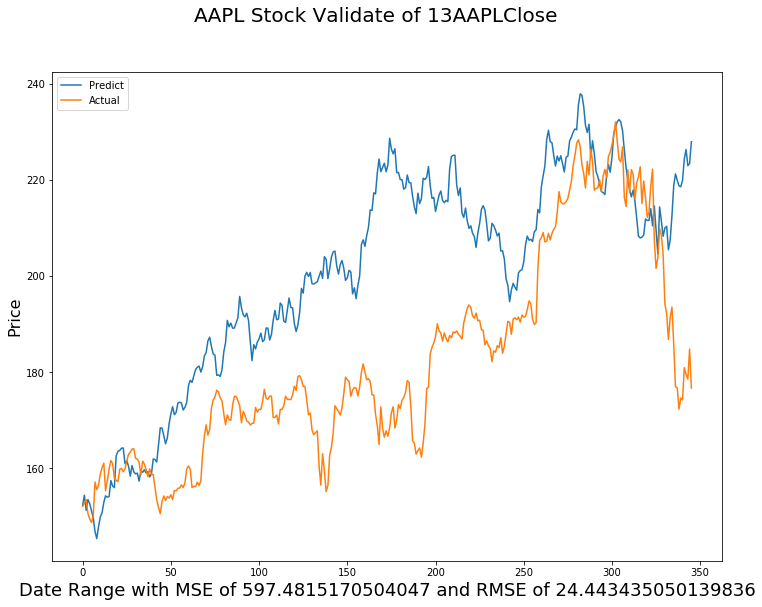

Start SVM.......
MSE_value 454.394256969359


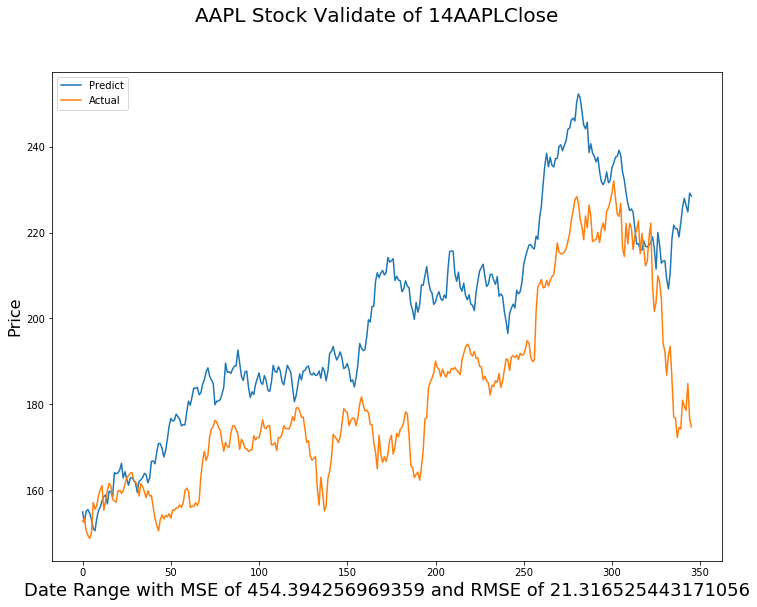

Start SVM.......
MSE_value 367.4660879086083


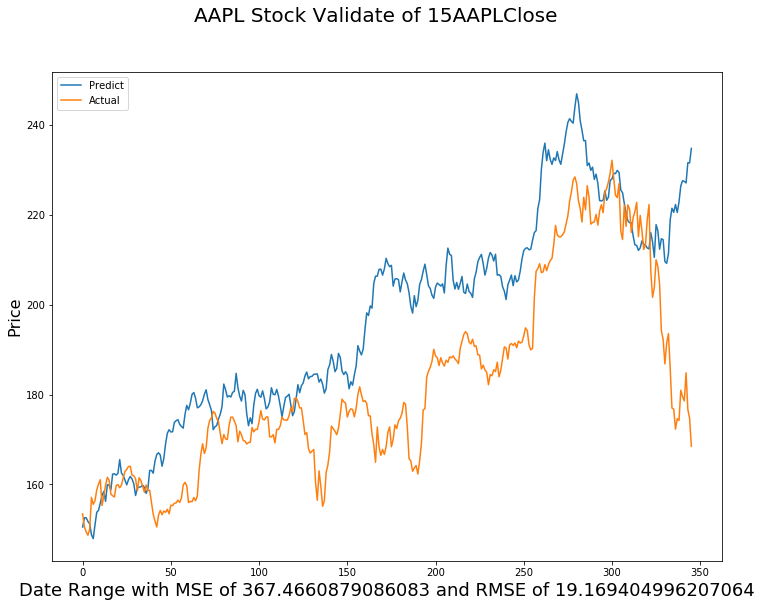

Start SVM.......
MSE_value 273.41652932055547


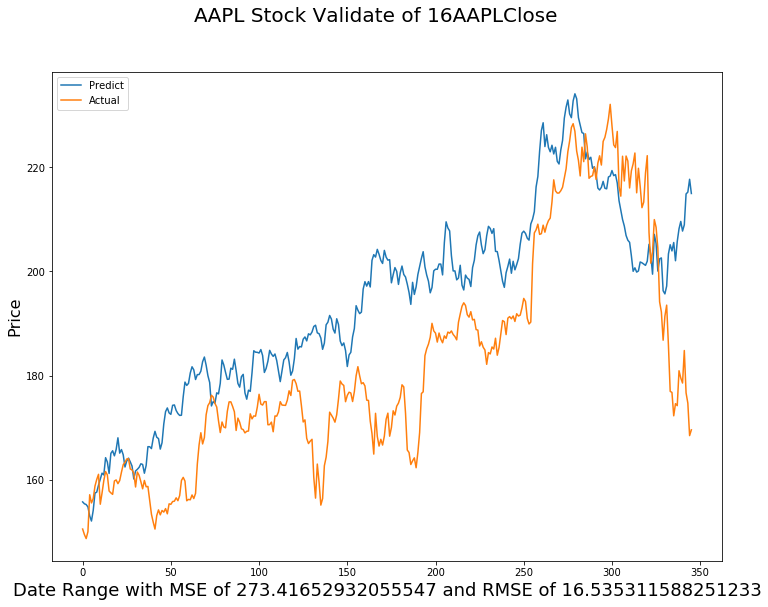

Start SVM.......
MSE_value 146.34479637904073


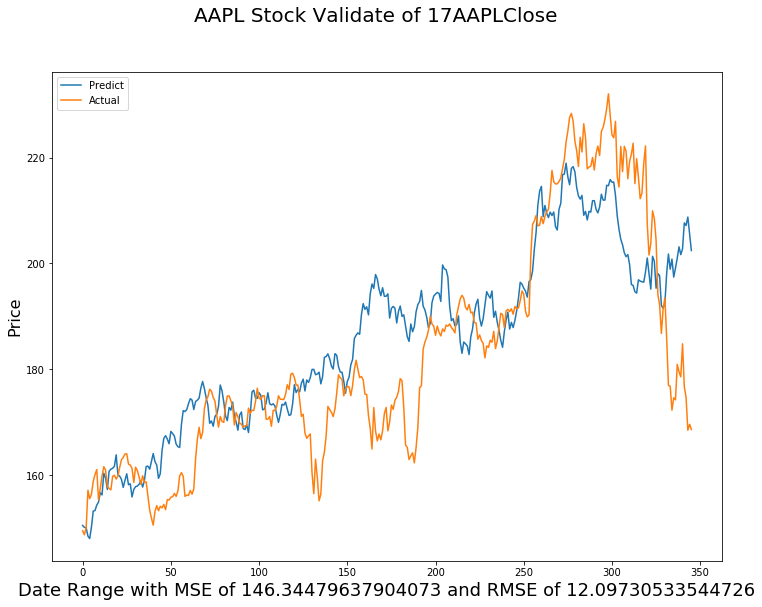

Start SVM.......
MSE_value 169.65748283810905


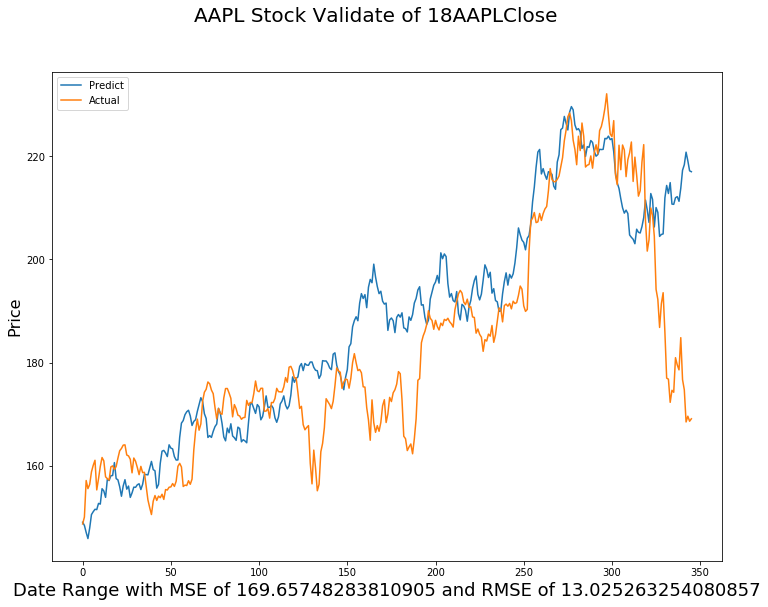

Start SVM.......
MSE_value 186.72335465011489


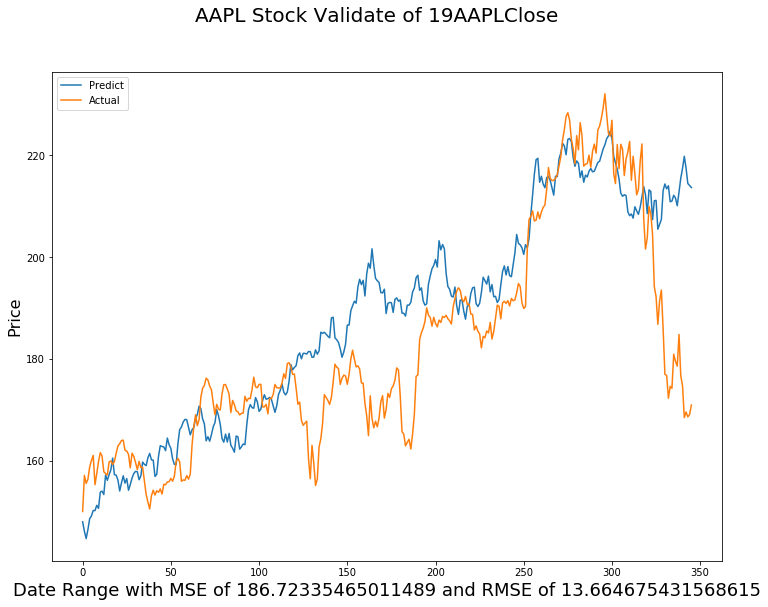

Start SVM.......
MSE_value 198.77512628464436


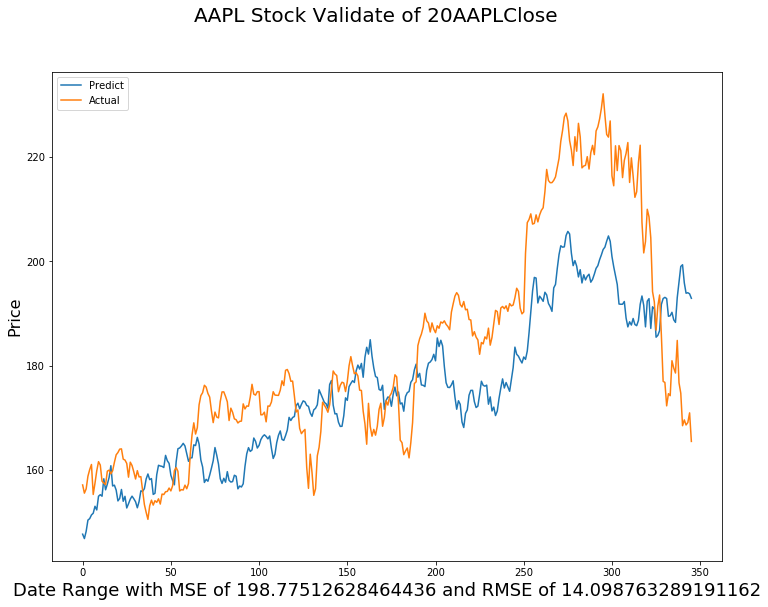

Start SVM.......
MSE_value 141.77690765929242


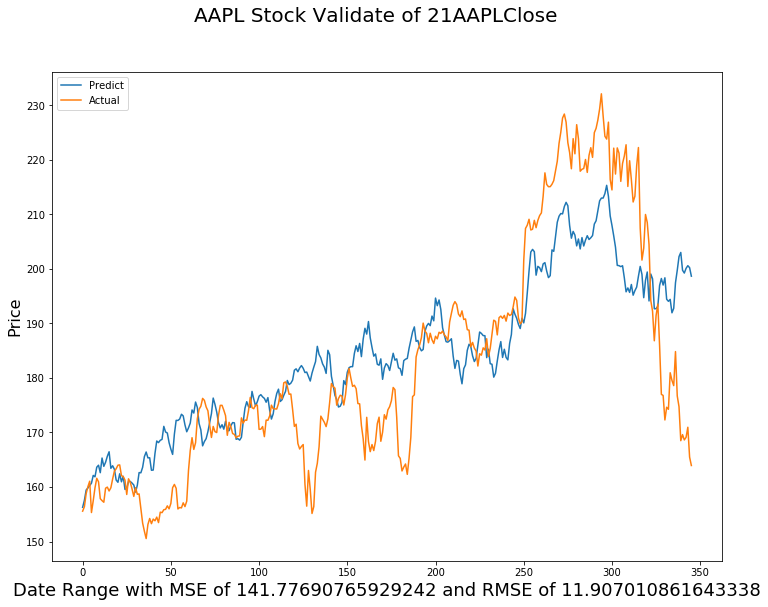

Start SVM.......
MSE_value 200.4080076235766


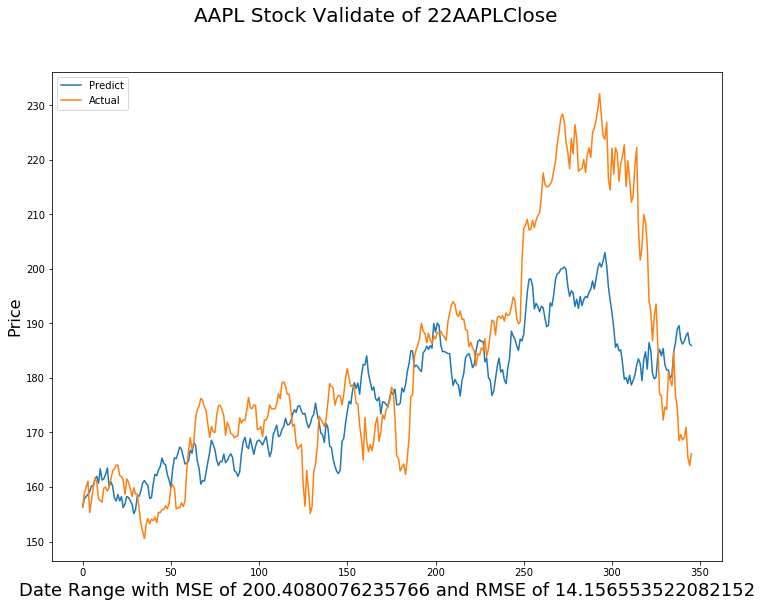

Start SVM.......
MSE_value 293.34971752400594


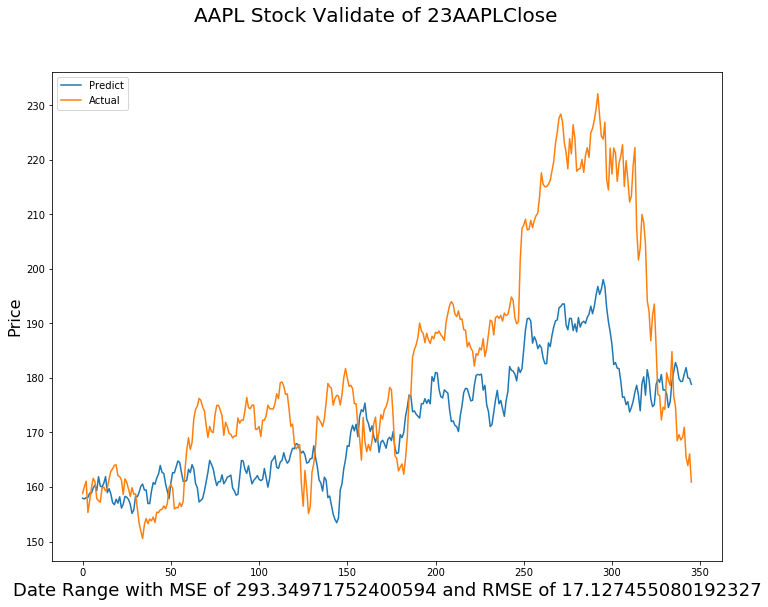

Start SVM.......
MSE_value 288.5177517865597


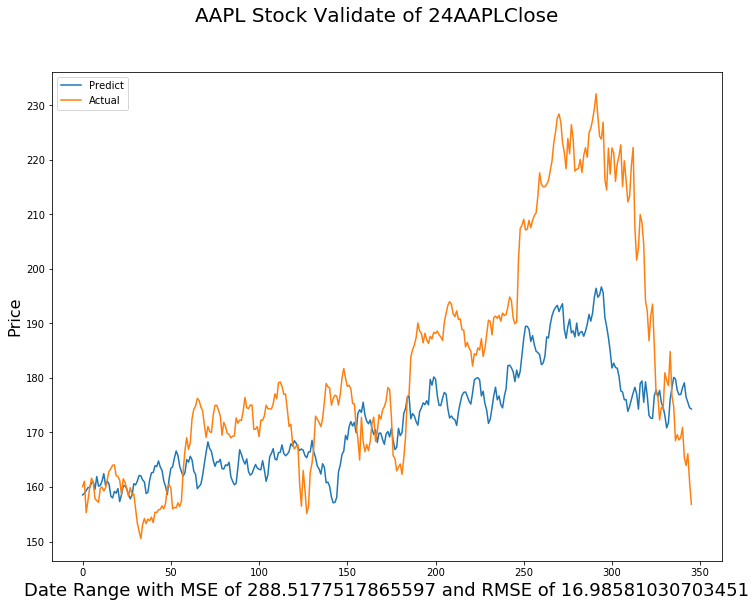

Start SVM.......
MSE_value 352.2973260188083


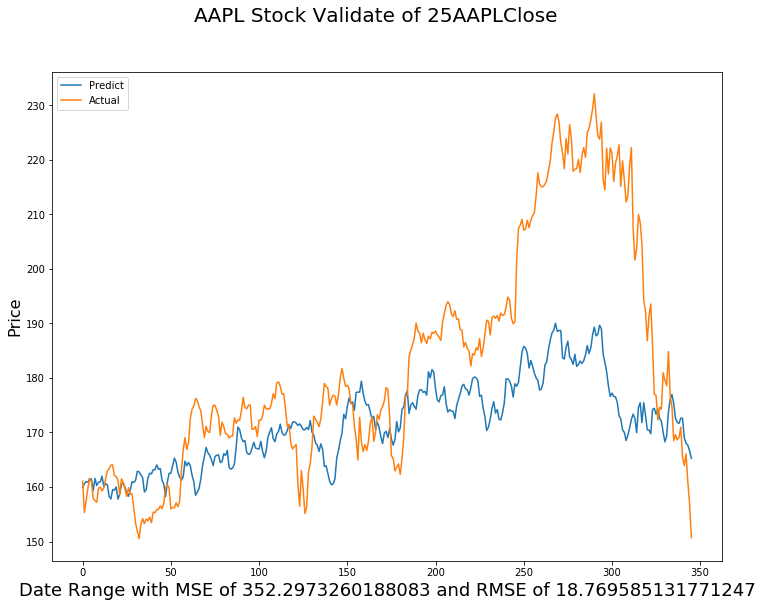

Start SVM.......
MSE_value 396.56925267098745


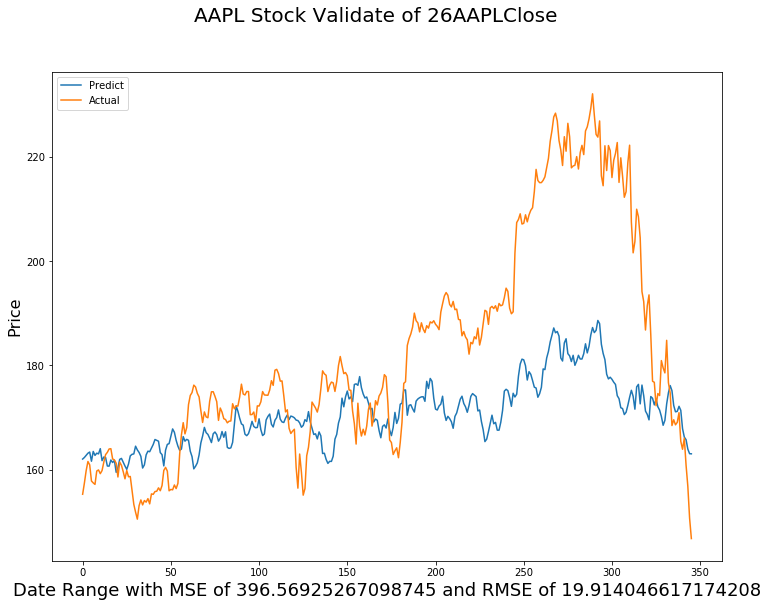

Start SVM.......
MSE_value 792.2958878695291


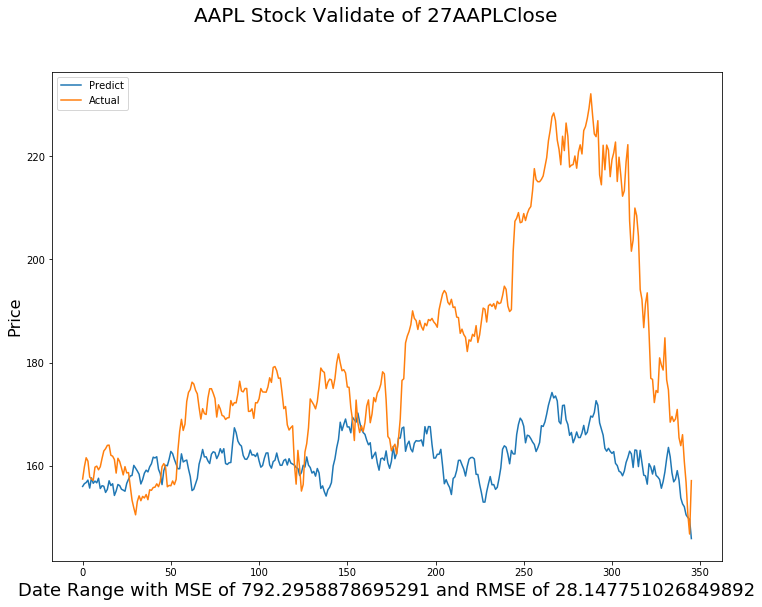

Start SVM.......
MSE_value 913.9352313453677


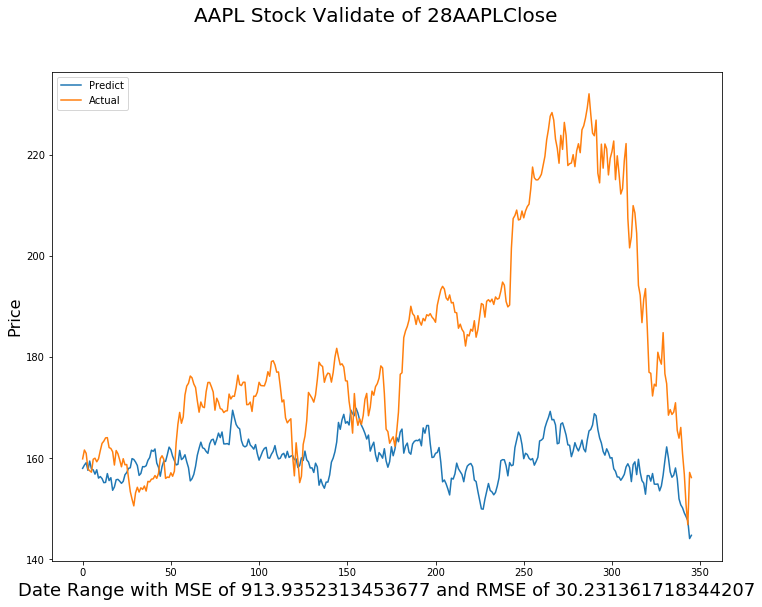

Start SVM.......
MSE_value 773.4188918026776


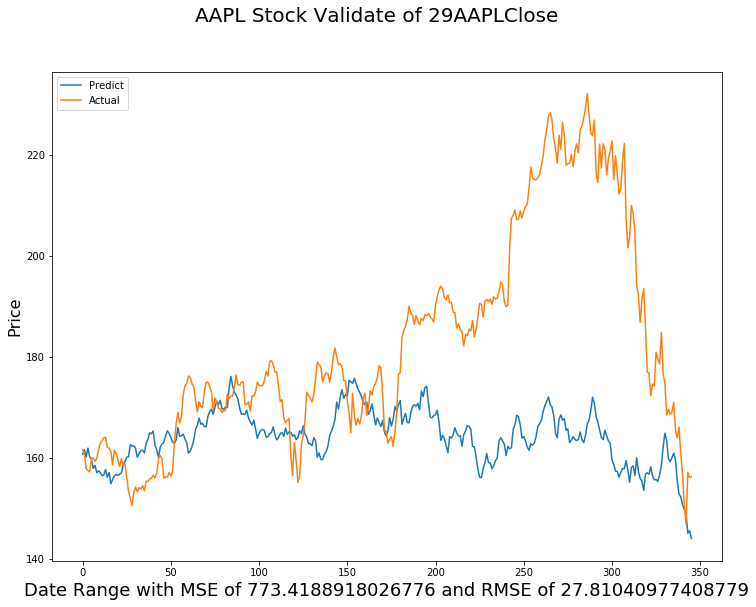

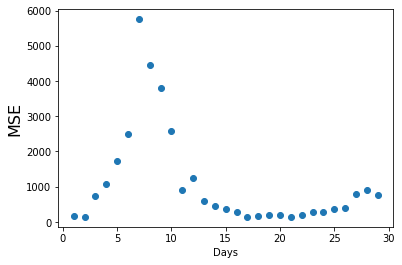

In [19]:
SVM_model(use_scale=True, use_PCA=False, stock=['AAPL'], K='linear')

One interesting observation from the experiment above: Using 4-7 previous days of data causes the model to mishave. Our hypthesis is that with using more data point, the model would be more fit, and thus would reduce the error. With the lowest RMSE score of about 12, ARIMA model has a better performance.

Start!!
Start SVM.......
MSE_value 96.62034721057043


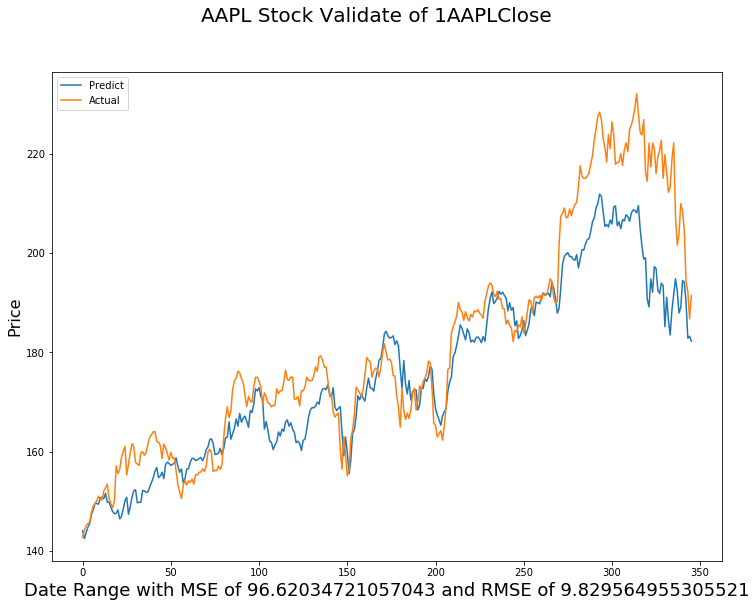

Start SVM.......
MSE_value 55.8079222424322


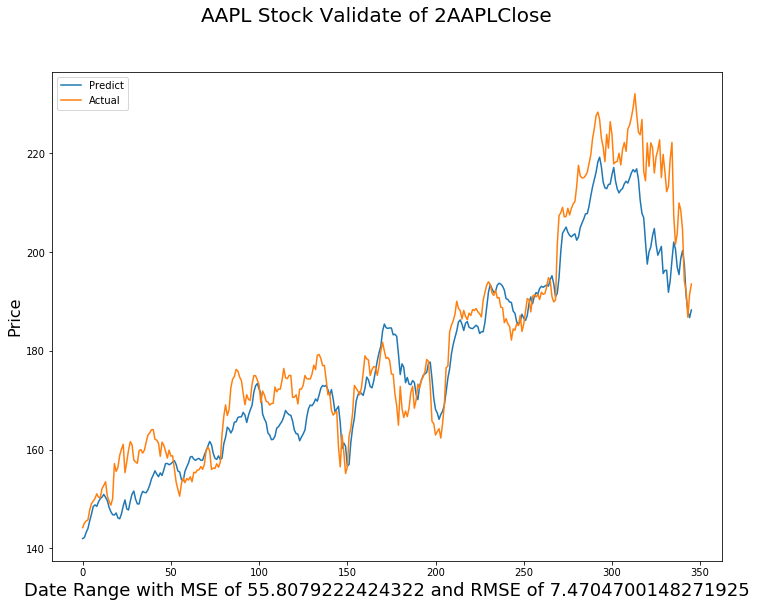

Start SVM.......
MSE_value 42.39404153763783


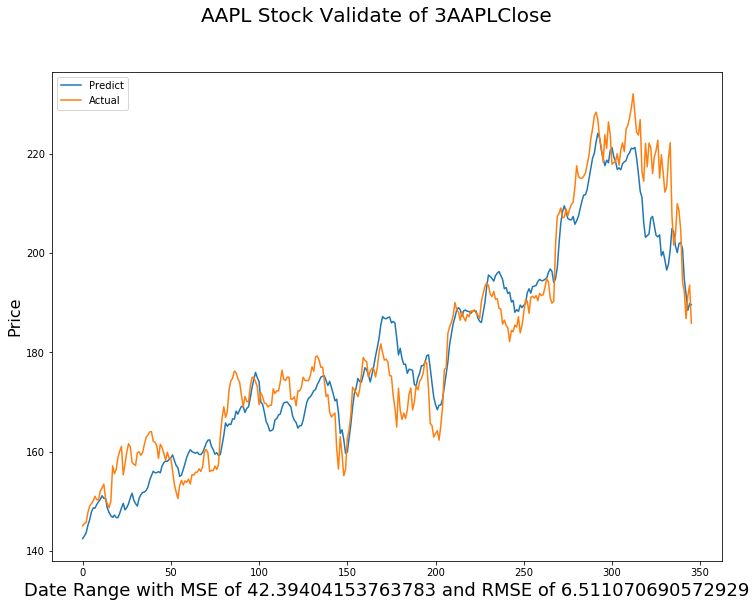

Start SVM.......
MSE_value 44.21709244102023


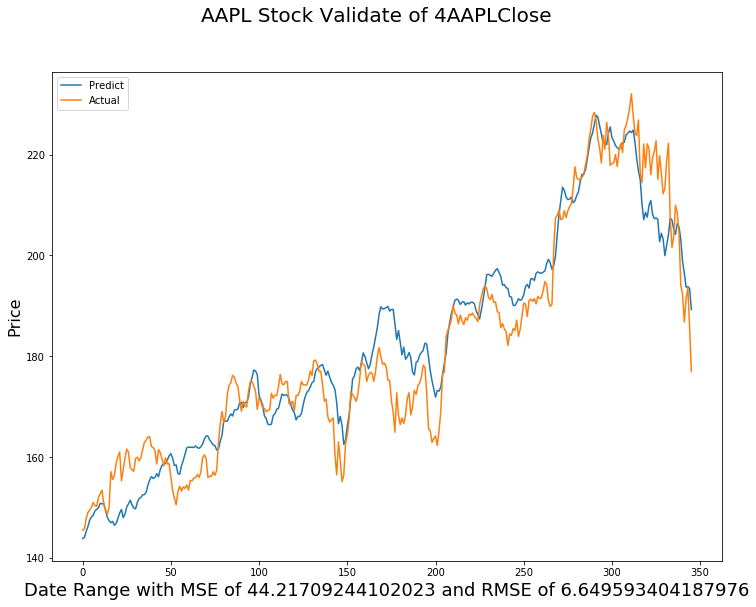

Start SVM.......
MSE_value 81.26824048227554


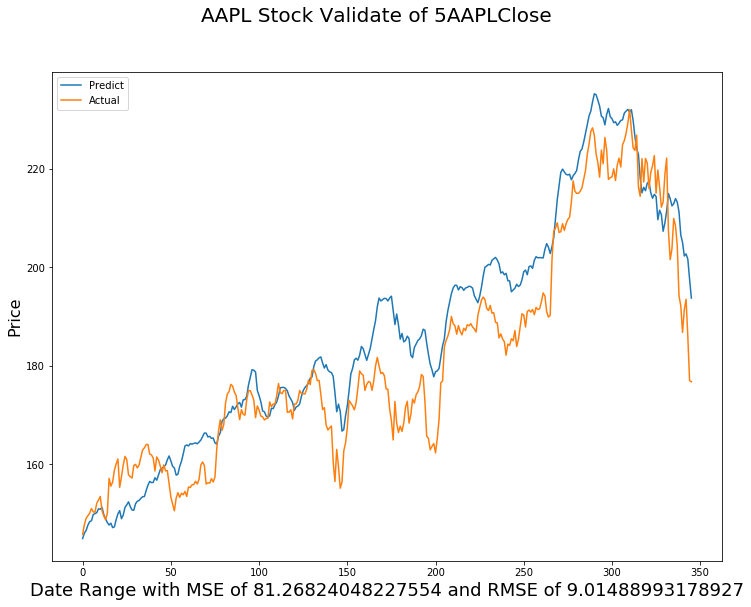

Start SVM.......
MSE_value 131.68714384466114


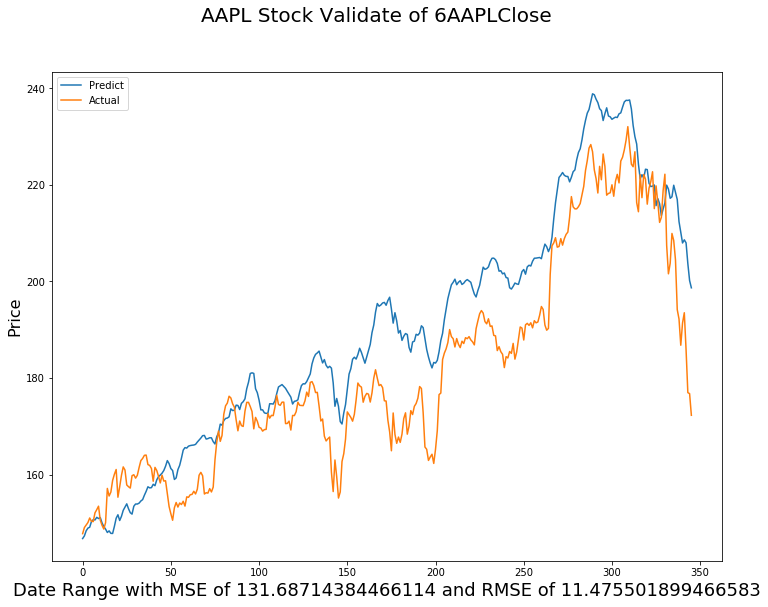

Start SVM.......
MSE_value 183.09858887658484


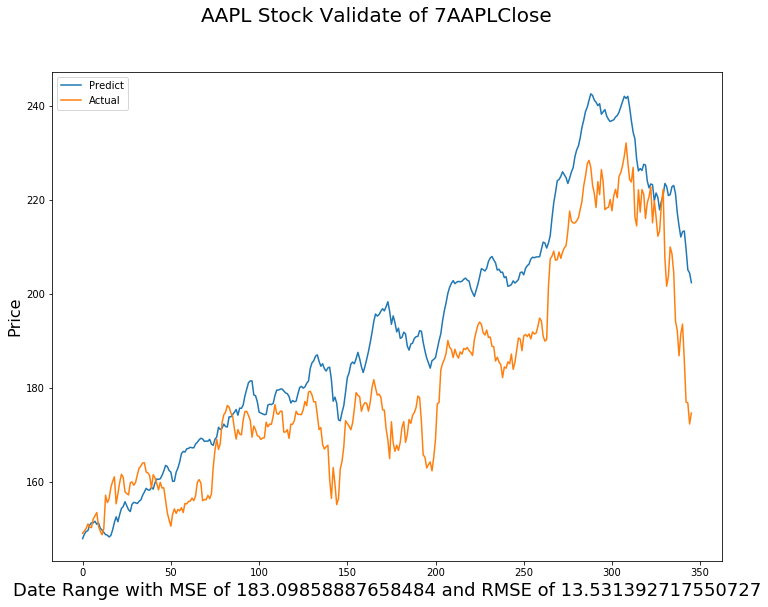

Start SVM.......
MSE_value 197.58852865021672


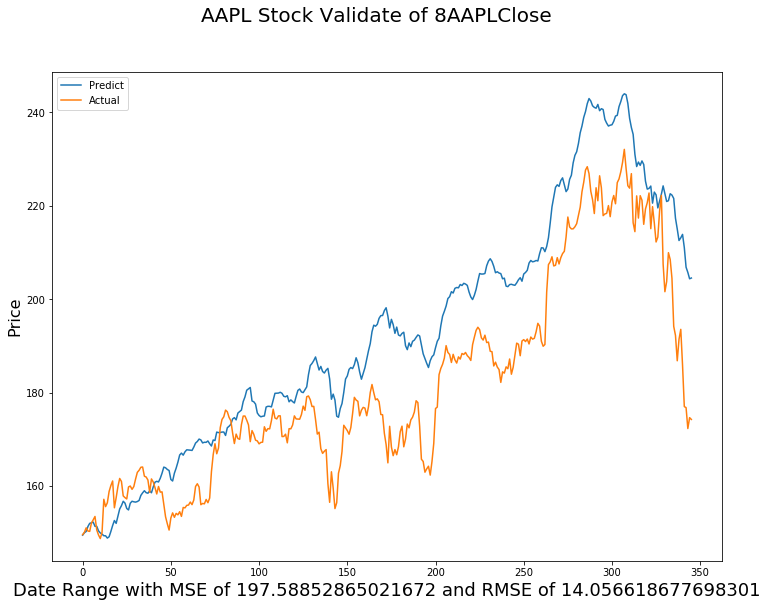

Start SVM.......
MSE_value 239.660701495136


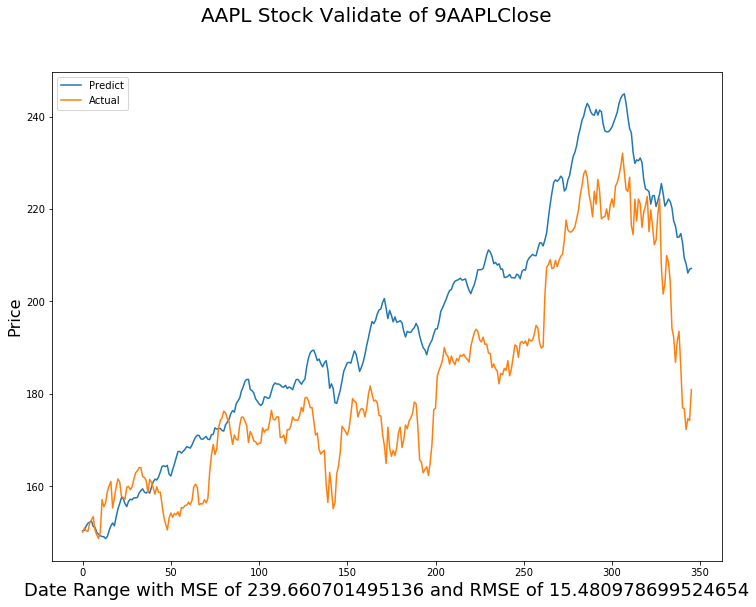

Start SVM.......
MSE_value 182.9346739840705


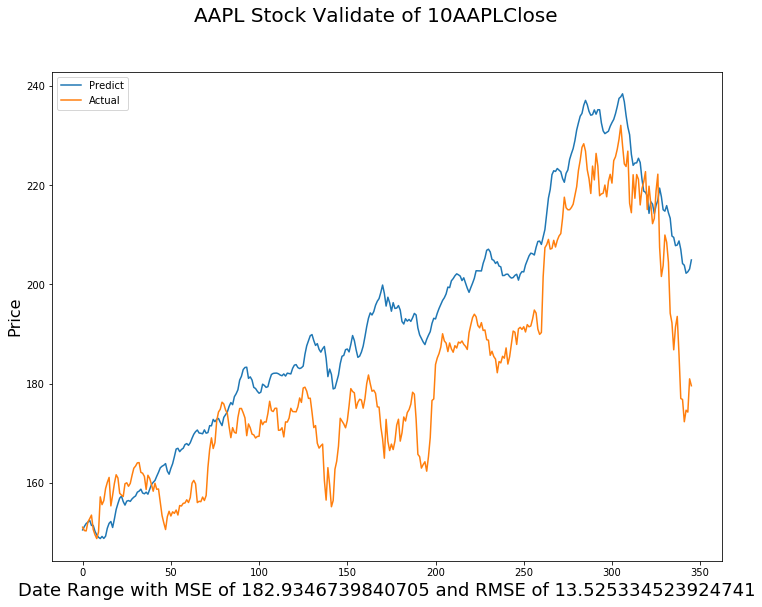

Start SVM.......
MSE_value 135.43598431732934


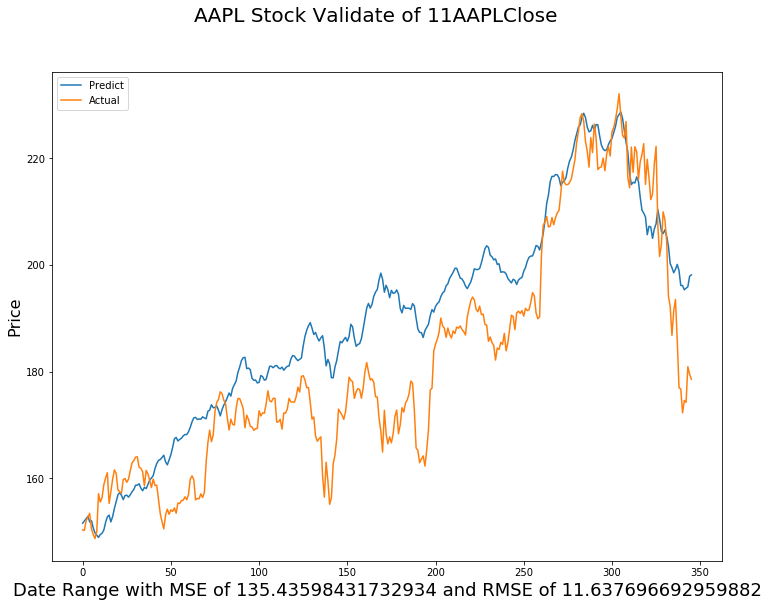

Start SVM.......
MSE_value 109.51131261563489


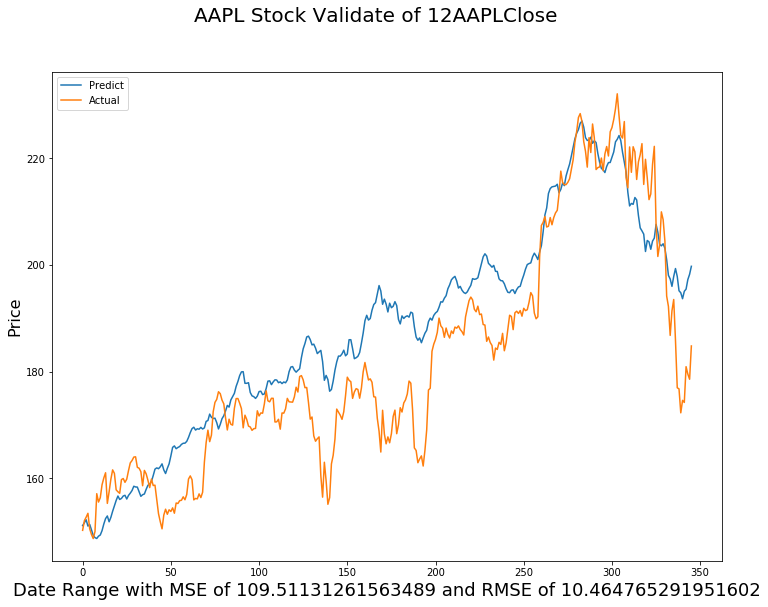

Start SVM.......
MSE_value 84.77158610020676


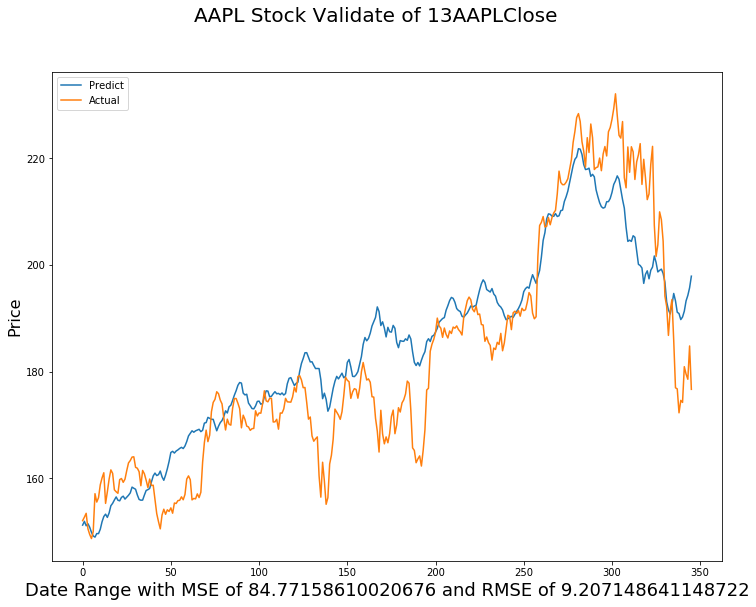

Start SVM.......
MSE_value 87.17135230440137


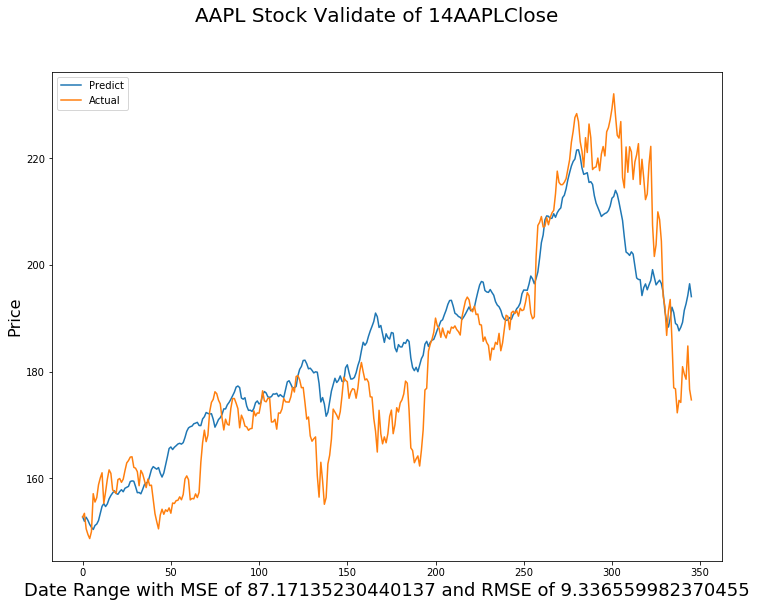

Start SVM.......
MSE_value 105.6388362595315


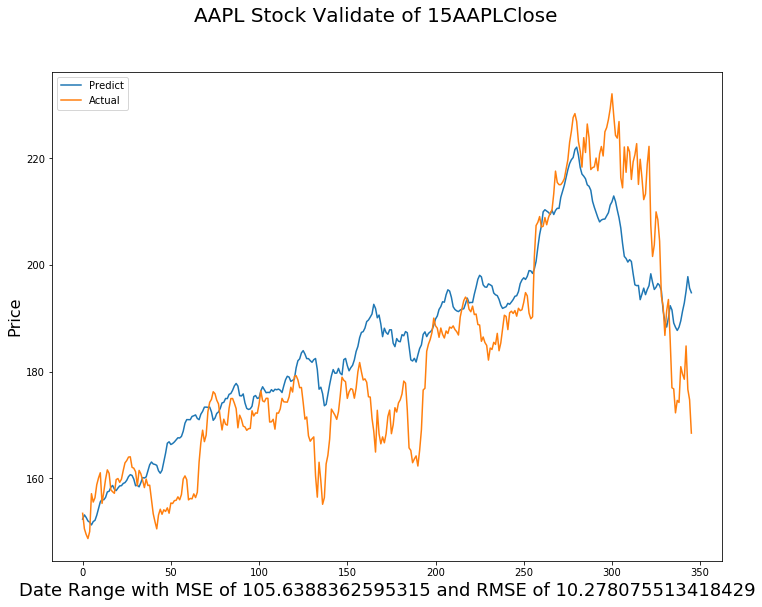

Start SVM.......
MSE_value 112.41019524705403


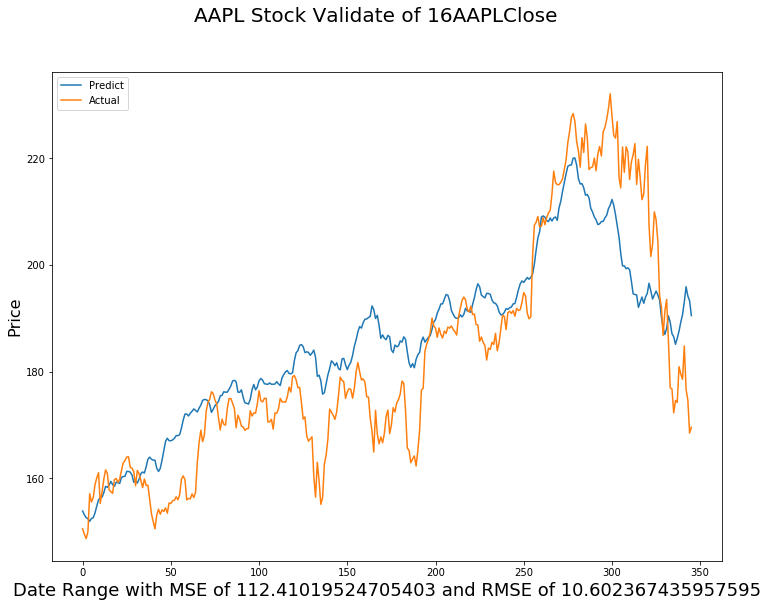

Start SVM.......
MSE_value 101.38614265930835


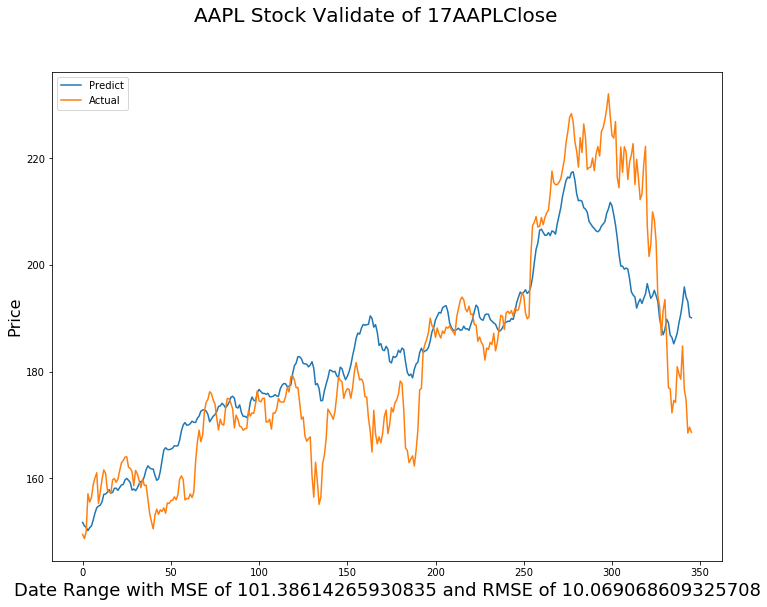

Start SVM.......
MSE_value 91.62622980085408


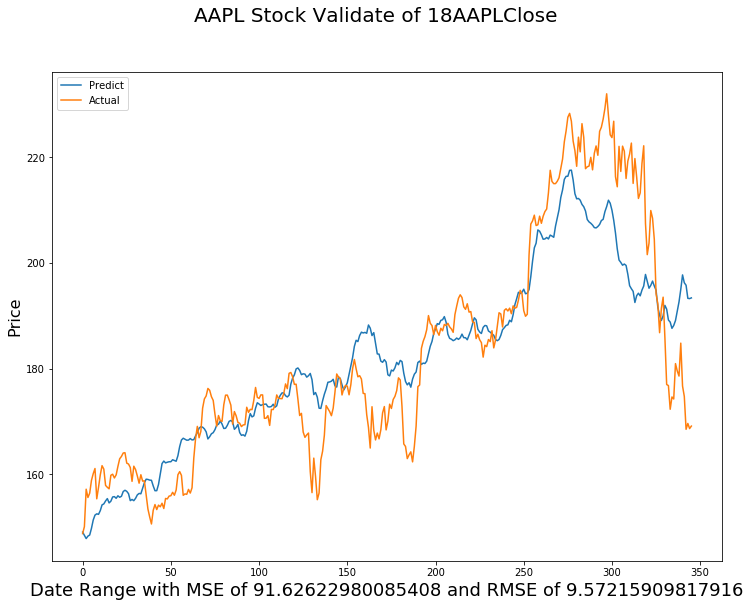

Start SVM.......
MSE_value 109.18359991915669


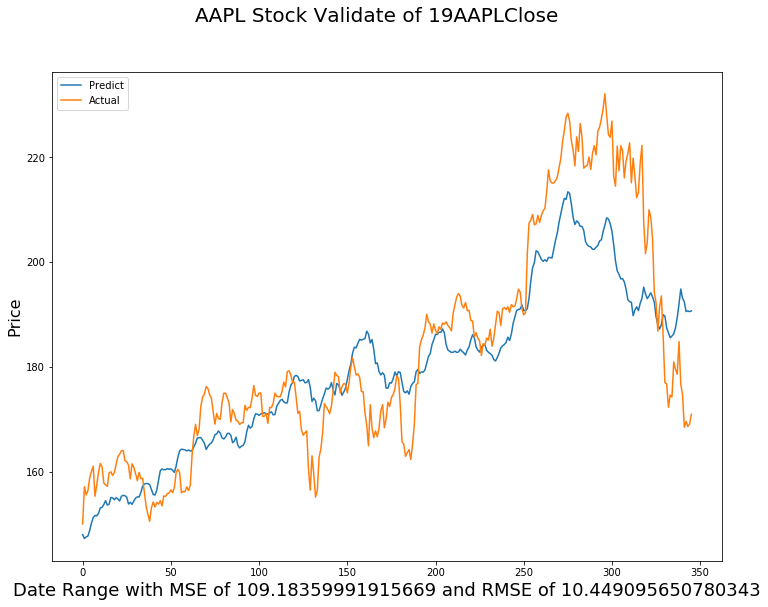

Start SVM.......
MSE_value 138.37399135713818


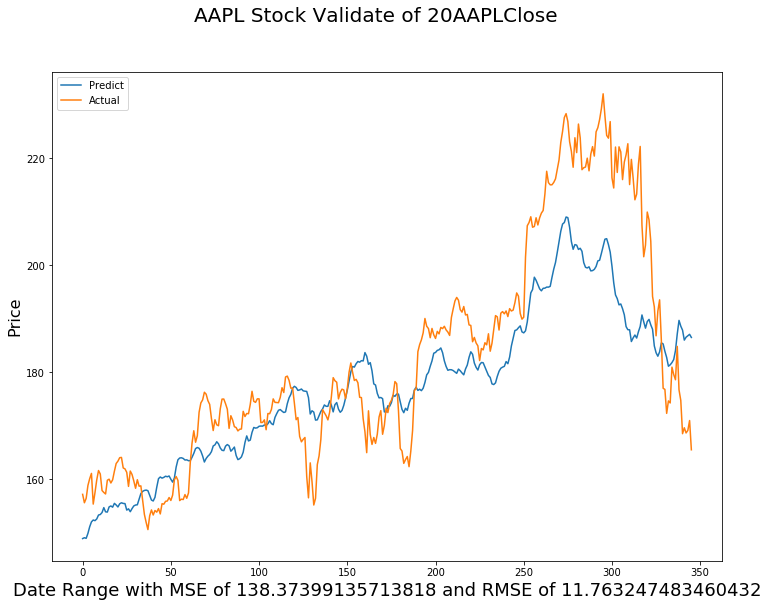

Start SVM.......
MSE_value 173.5841512765968


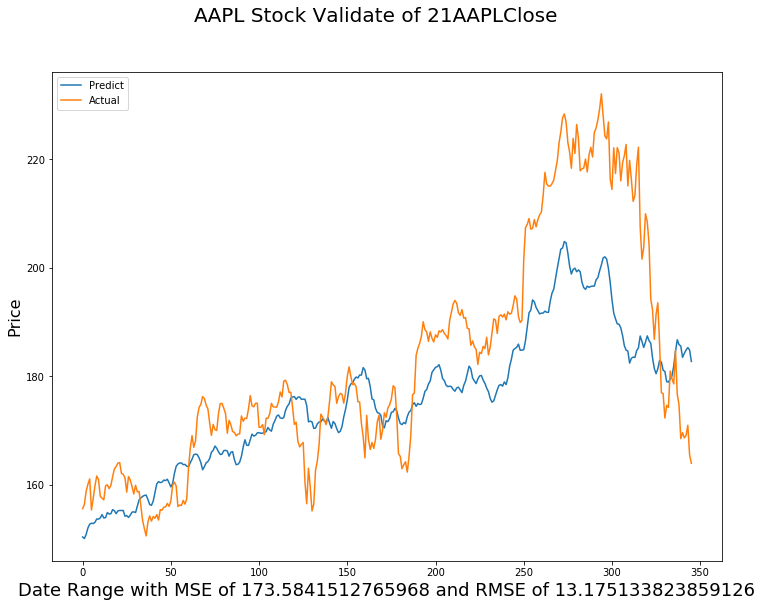

Start SVM.......
MSE_value 196.51493712591423


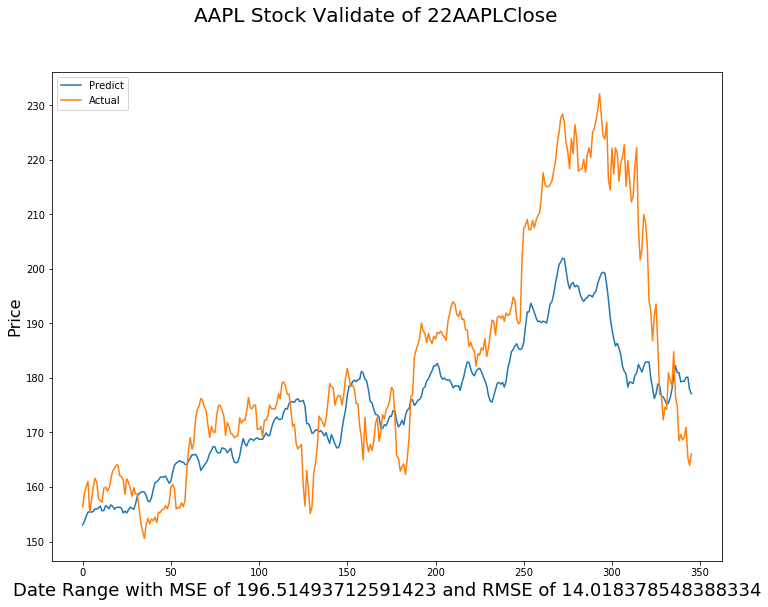

Start SVM.......
MSE_value 201.81913044277655


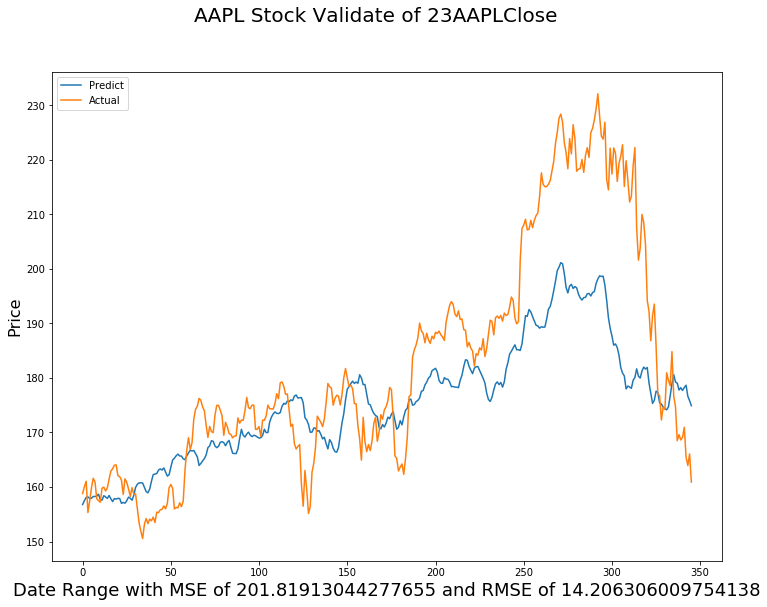

Start SVM.......
MSE_value 215.27144735329748


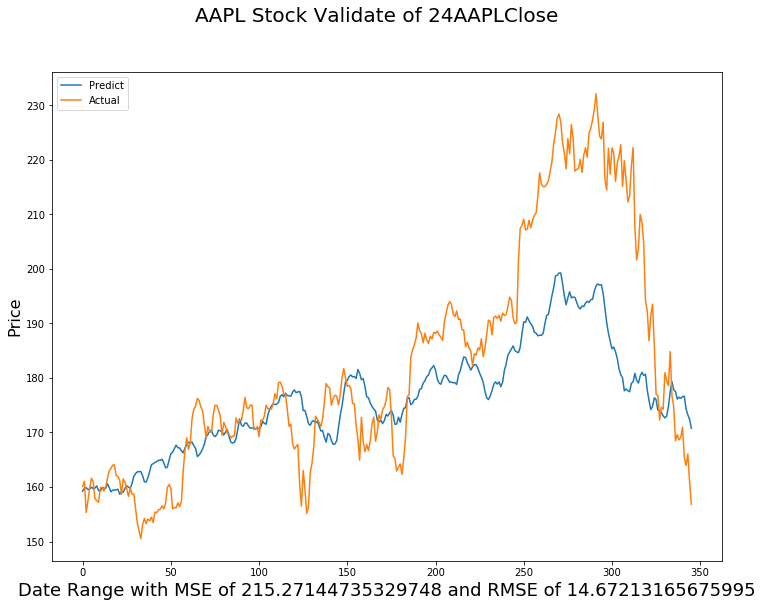

Start SVM.......
MSE_value 238.50816035965272


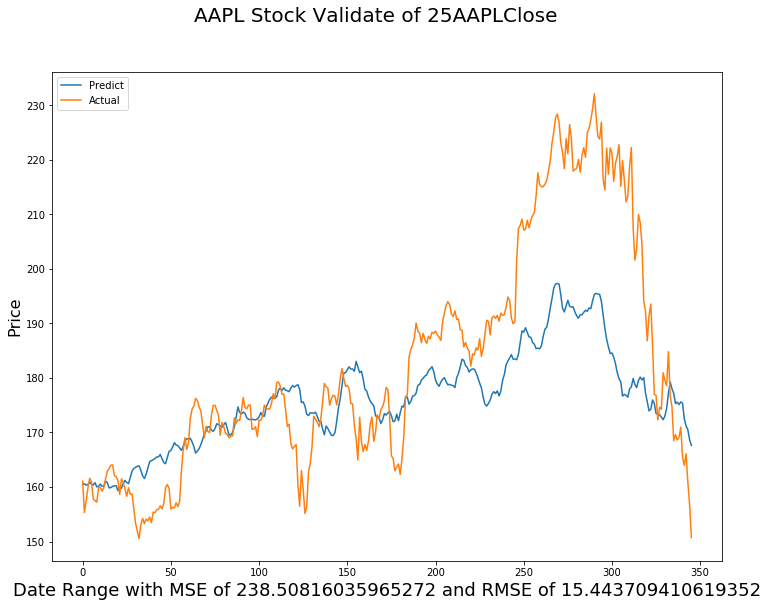

Start SVM.......
MSE_value 283.7792866324794


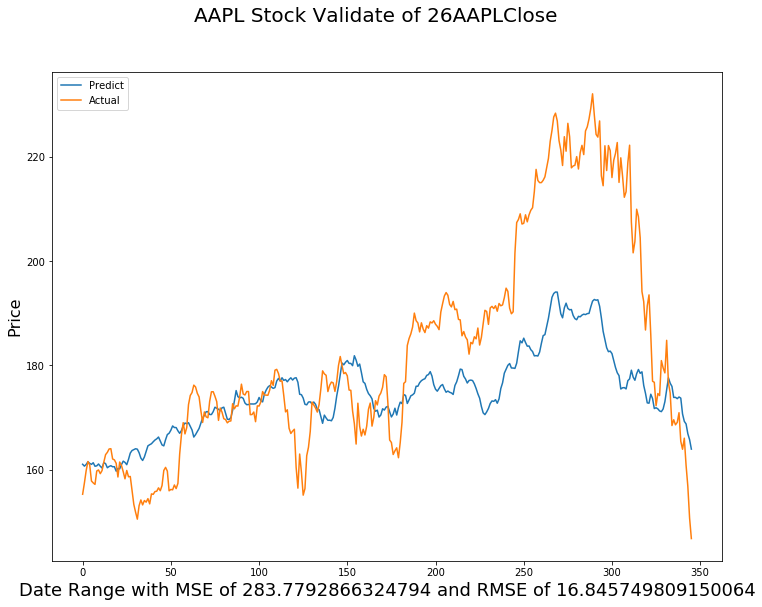

Start SVM.......
MSE_value 470.7962839305161


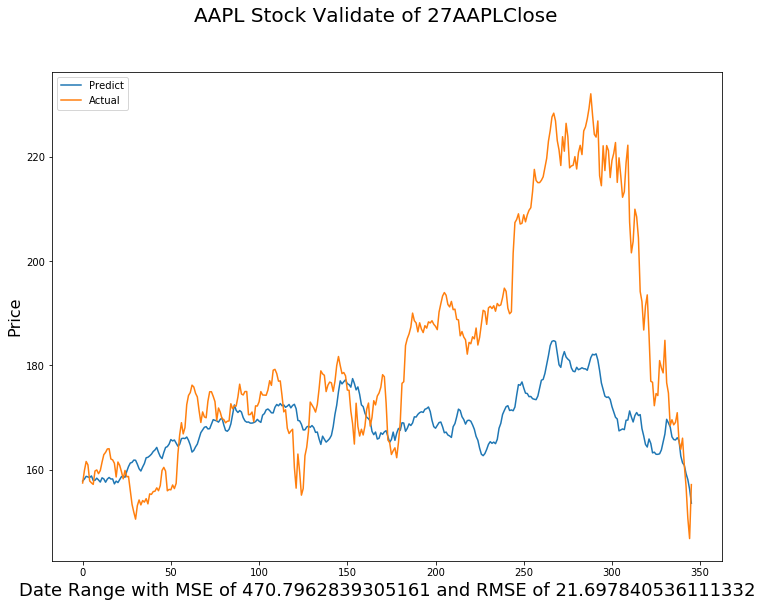

Start SVM.......
MSE_value 560.4614076214482


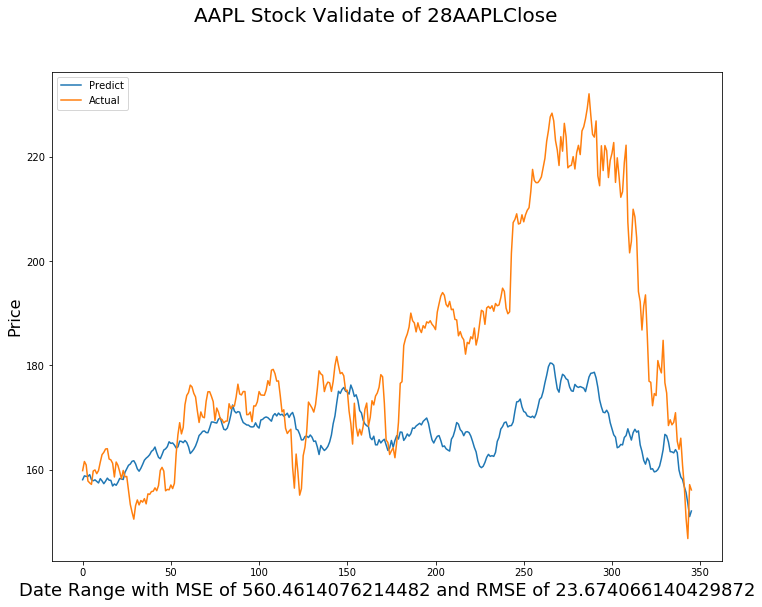

Start SVM.......
MSE_value 565.5159406348681


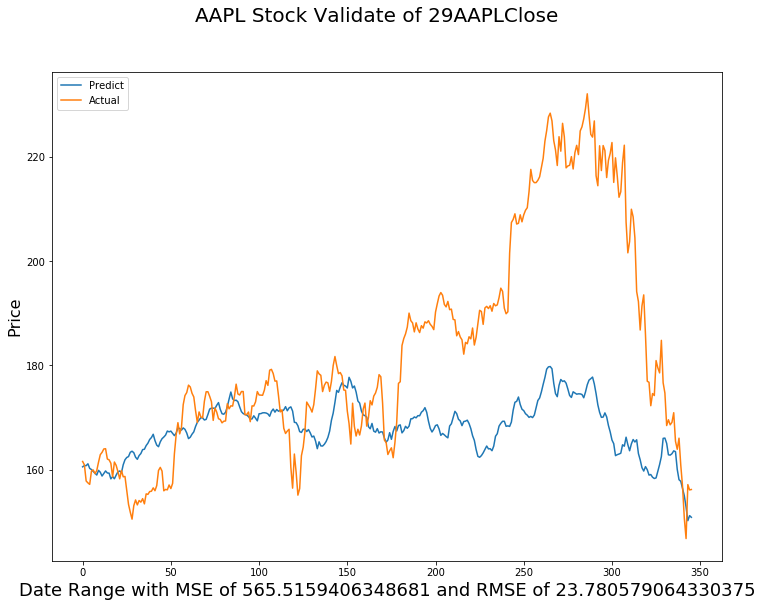

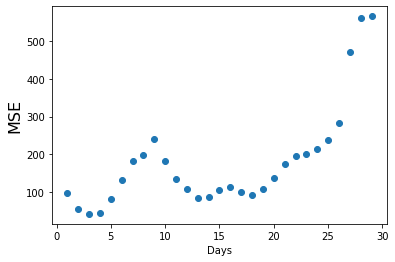

In [20]:
#Here, we can try to run the model without scaling.
SVM_model(use_scale=False, use_PCA=False, stock=['AAPL'], K='linear')

**Model Remark:** The graph suggest that using 3 previous days of data would give the best result. In this case, the RMSE is 6.2. It is also lower than ARIMA, but at least the prediction result did not use previous days price to come predict today's price. 

Another reason that not scaling the data gives a better performance is due to the fact that this is a non-stationary time series dataset, so that the test set might not be in the same scale with the training set.

Start!!
Start SVM.......
MSE_value 280.81024821722104


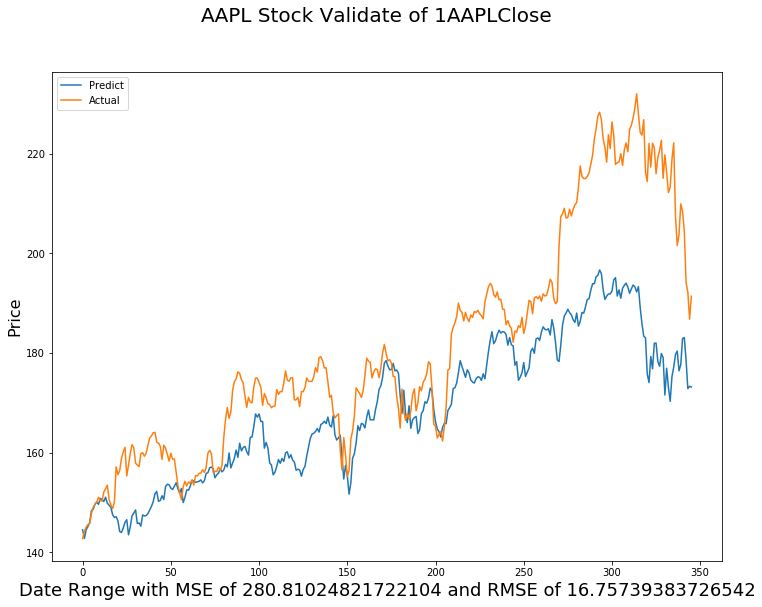

Start SVM.......
MSE_value 263.3371882703147


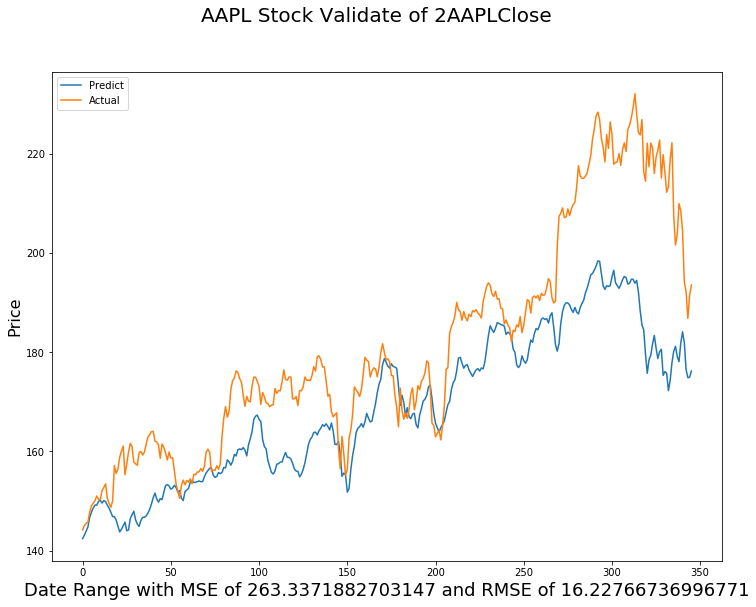

Start SVM.......
MSE_value 288.90297664228655


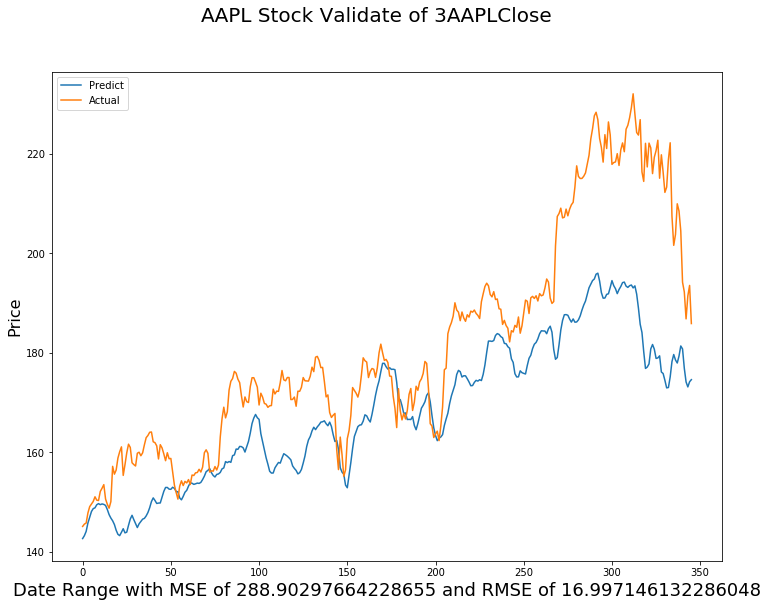

Start SVM.......
MSE_value 310.3610111292042


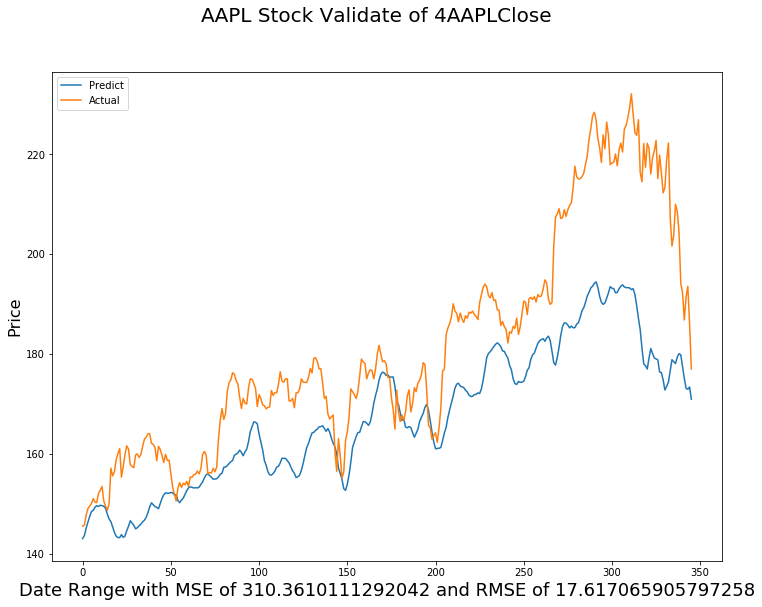

Start SVM.......
MSE_value 325.4774843962168


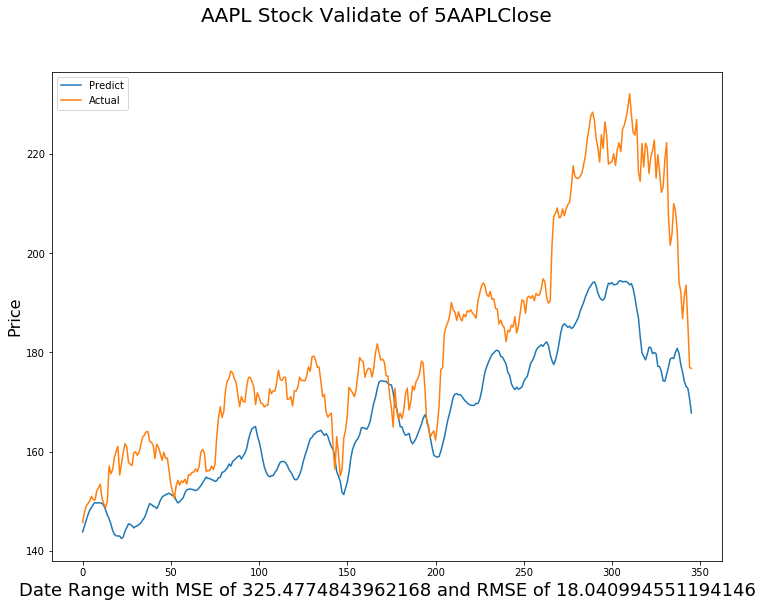

Start SVM.......
MSE_value 282.5403344257255


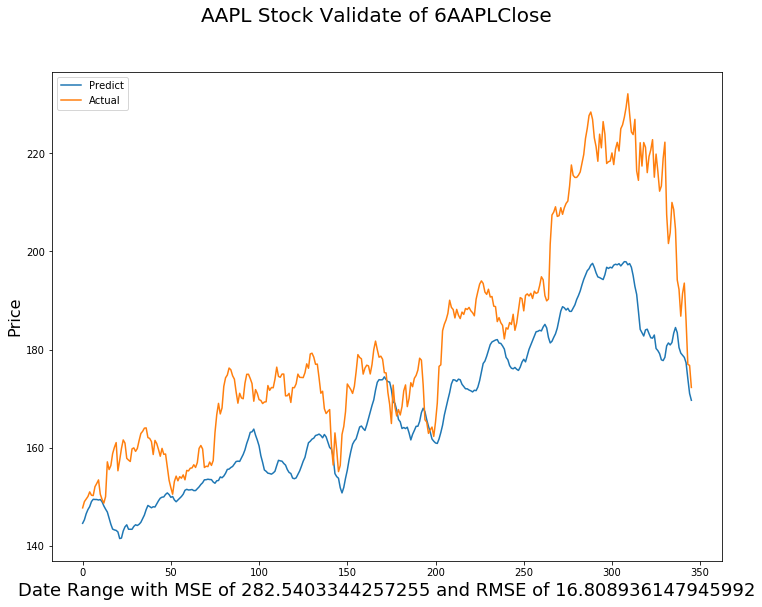

Start SVM.......
MSE_value 290.4299787914958


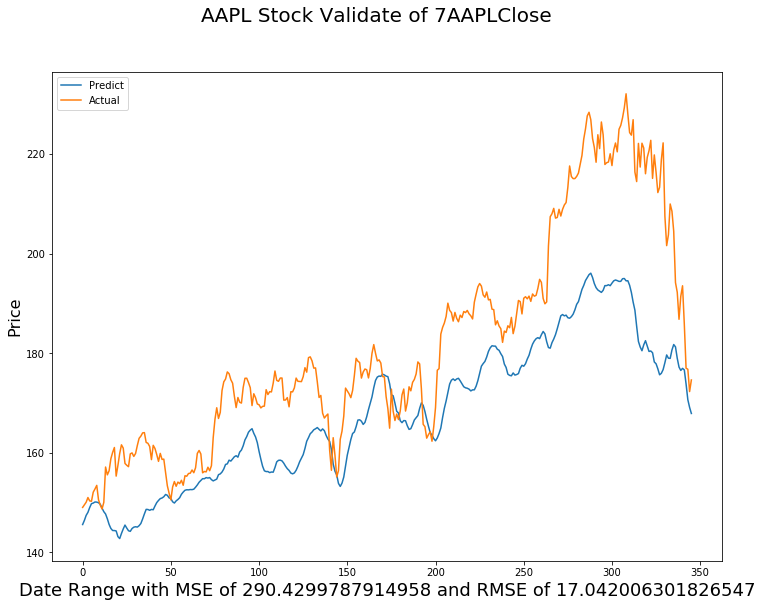

Start SVM.......
MSE_value 328.85720237623974


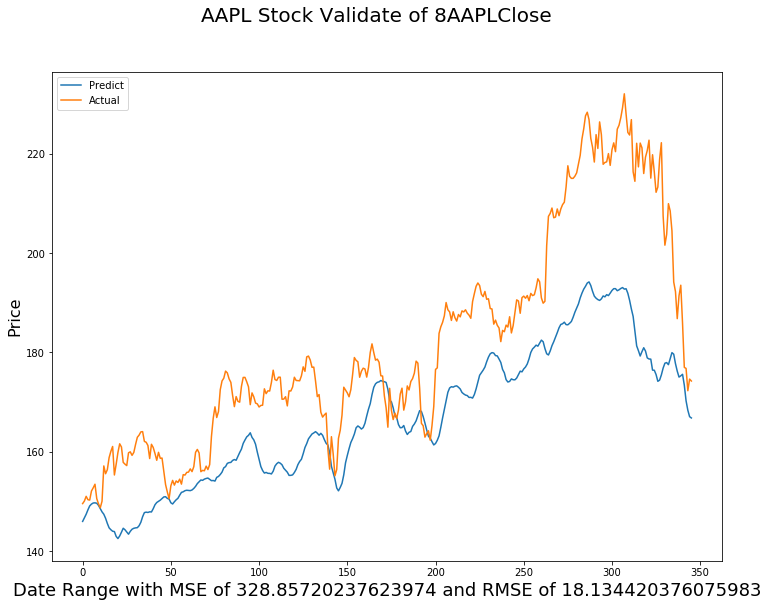

Start SVM.......
MSE_value 337.3188026409336


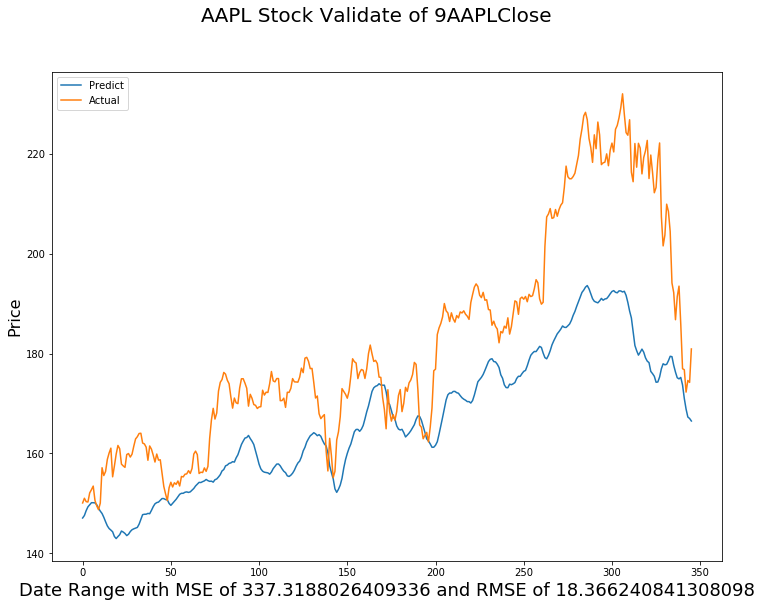

Start SVM.......
MSE_value 331.65657105992364


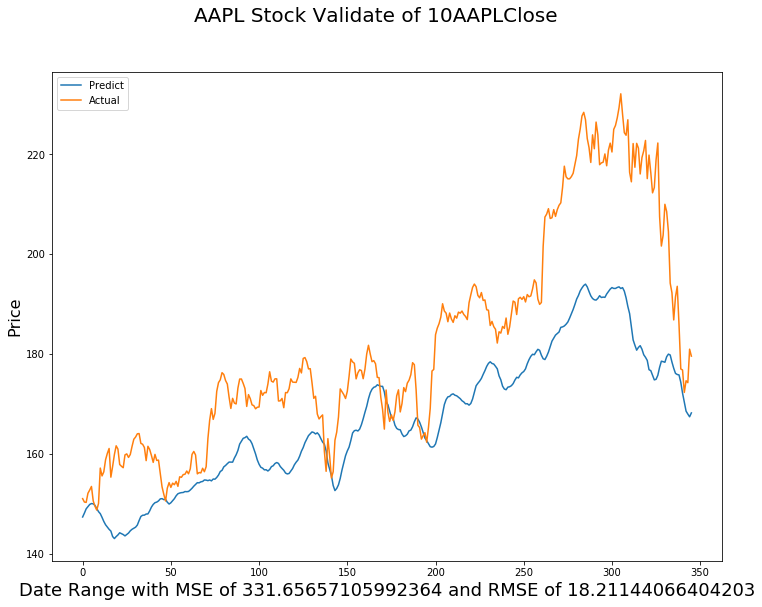

Start SVM.......
MSE_value 372.56837260528124


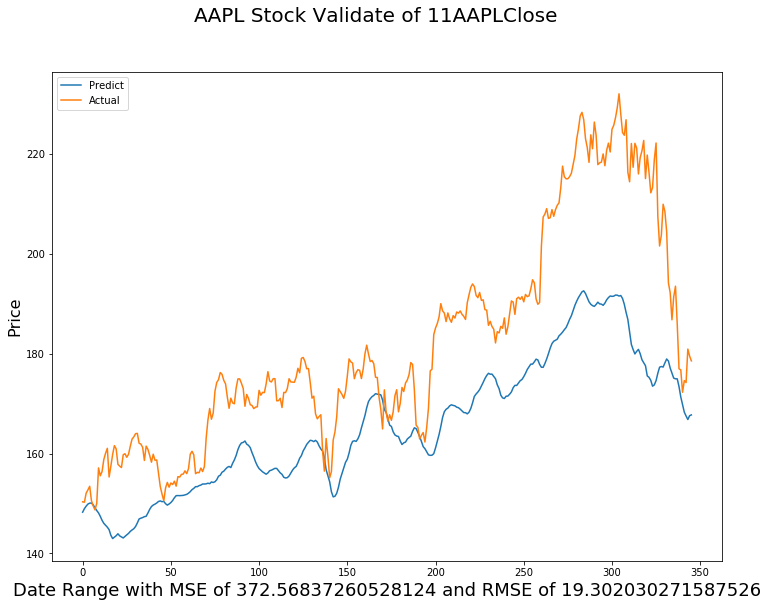

Start SVM.......
MSE_value 393.48823805704995


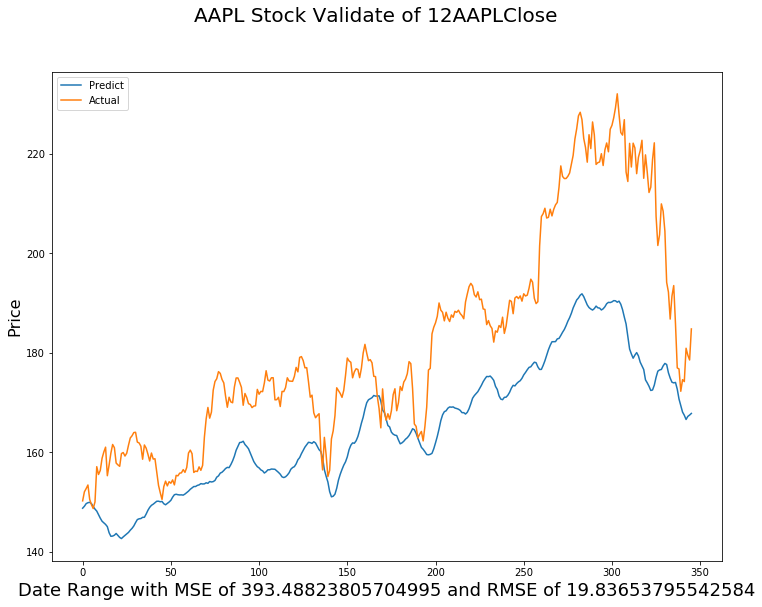

Start SVM.......
MSE_value 443.6983708869322


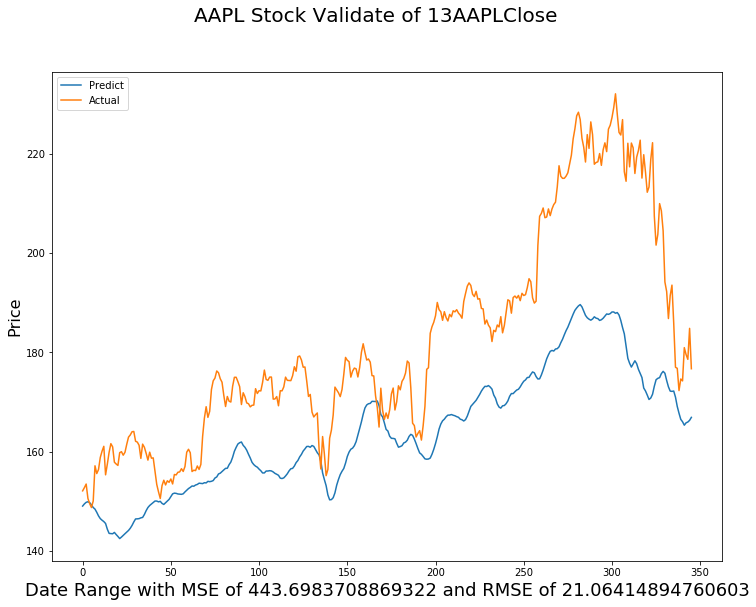

Start SVM.......
MSE_value 483.20398387784104


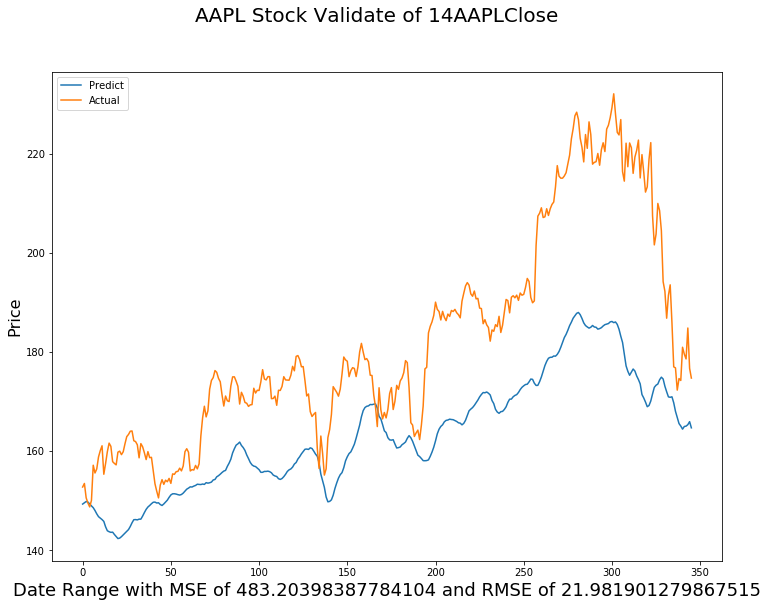

Start SVM.......
MSE_value 547.5146589730275


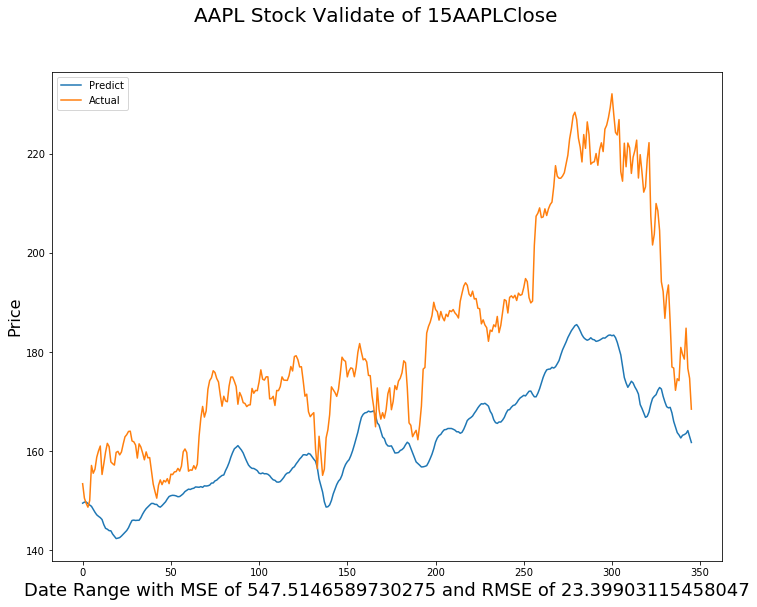

Start SVM.......
MSE_value 593.0396223940539


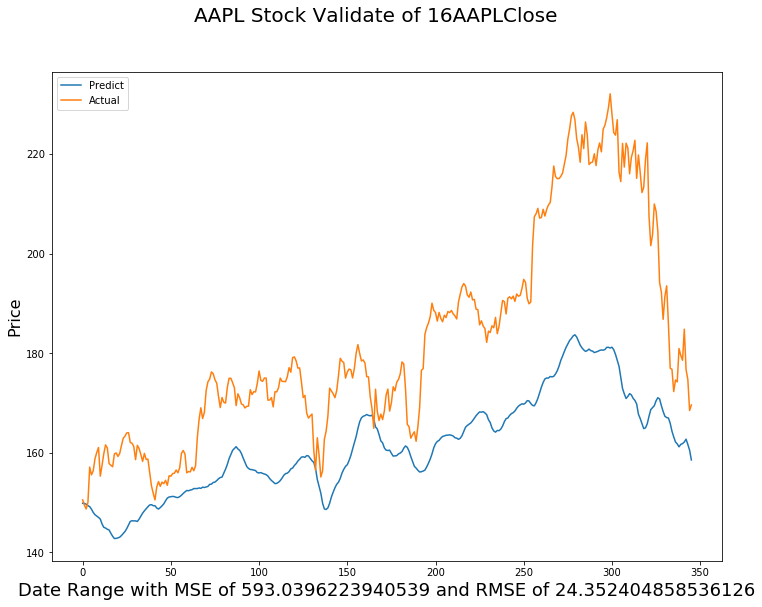

Start SVM.......
MSE_value 588.9448121911765


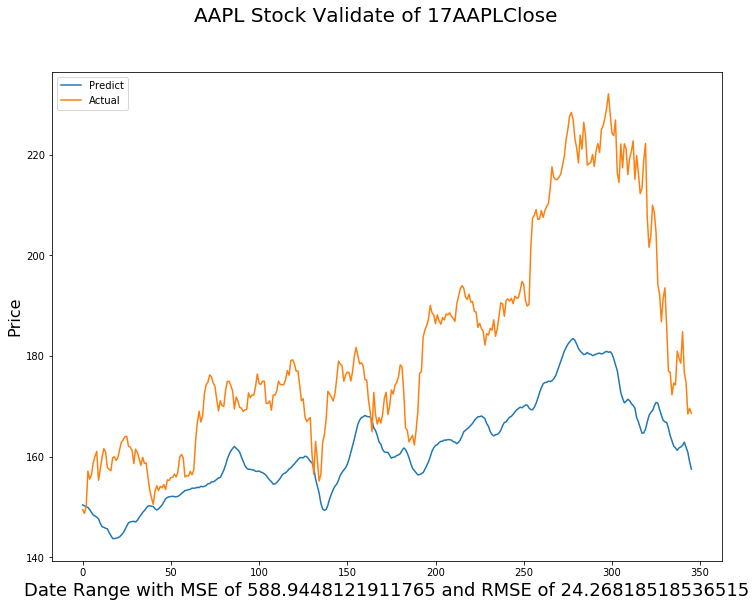

Start SVM.......
MSE_value 641.7510999225408


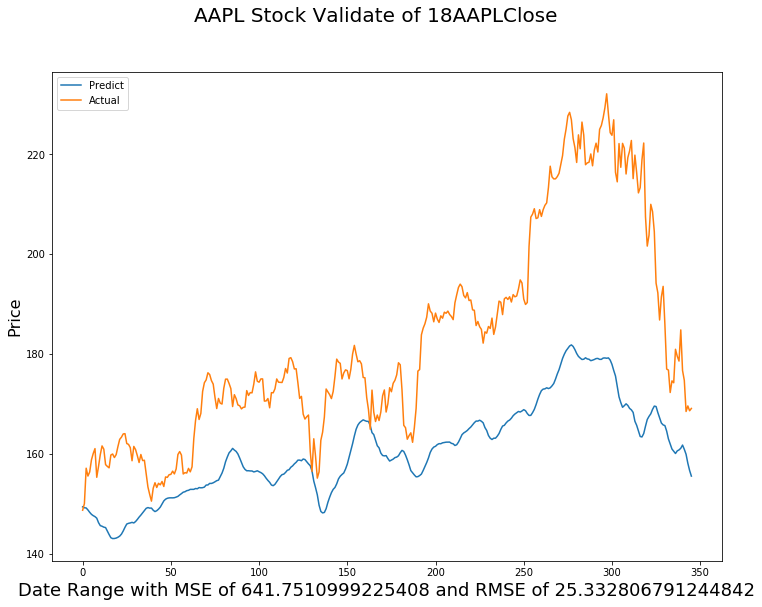

Start SVM.......
MSE_value 714.93877770005


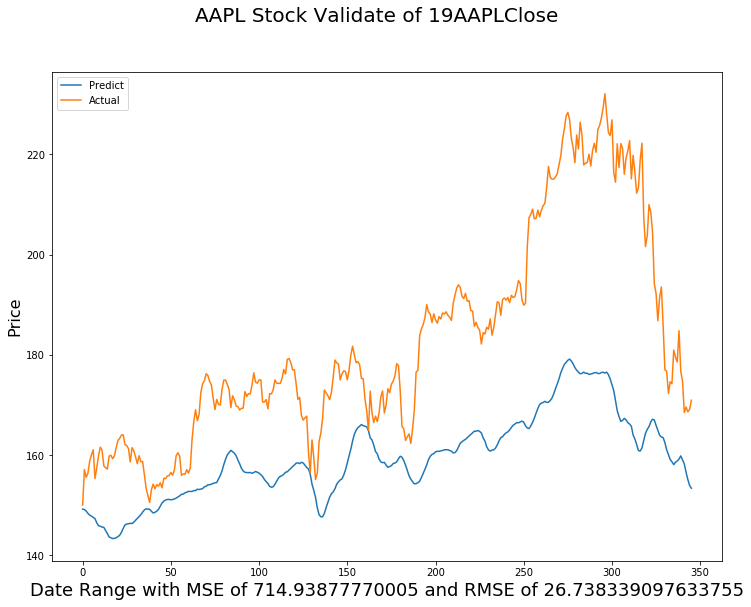

Start SVM.......
MSE_value 725.2502248841756


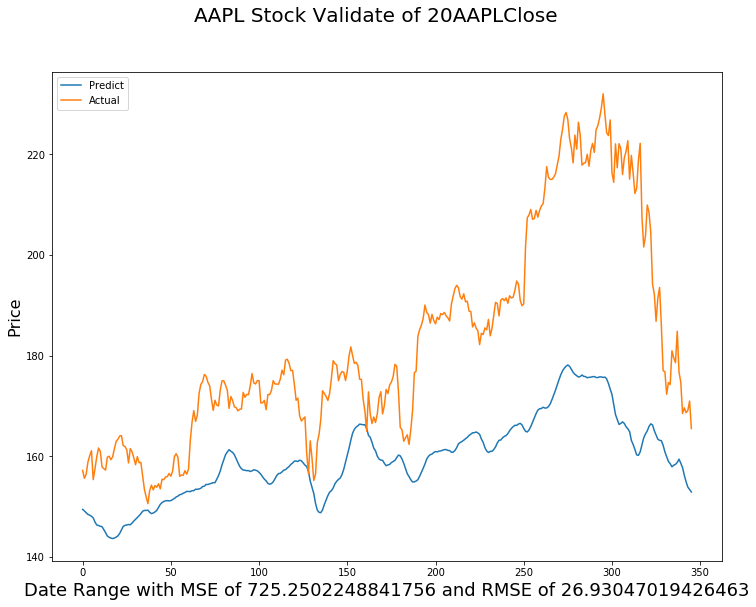

Start SVM.......
MSE_value 735.4856268830639


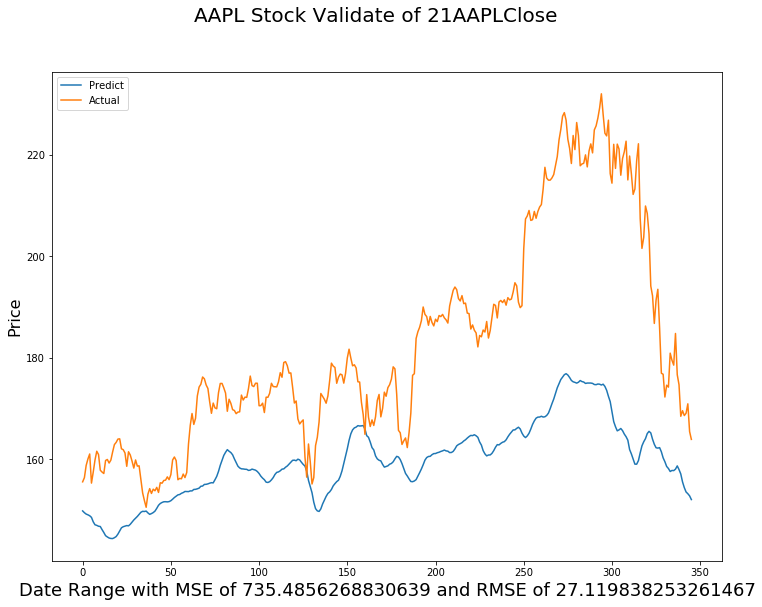

Start SVM.......
MSE_value 706.3836159464418


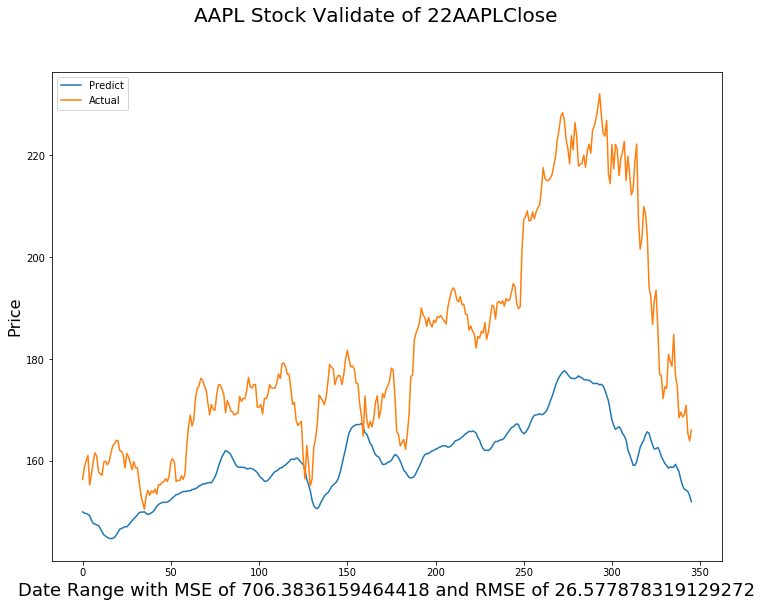

Start SVM.......
MSE_value 658.829706547816


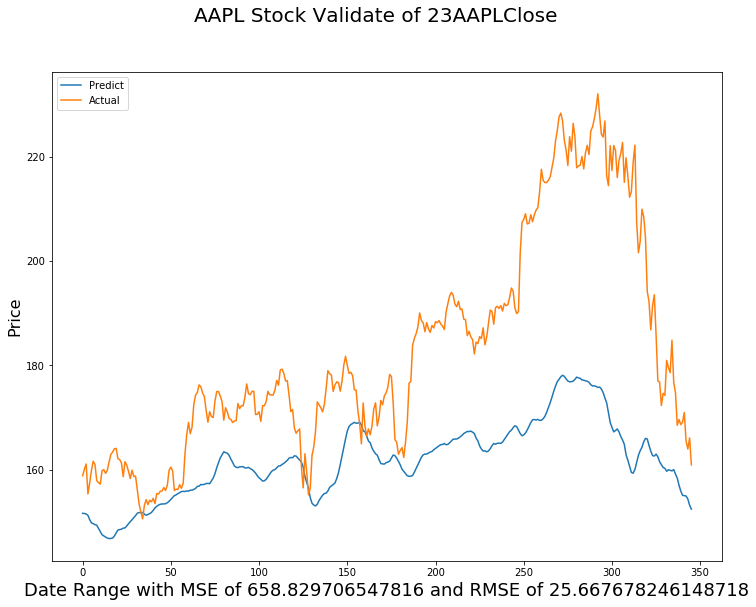

Start SVM.......
MSE_value 554.8066928919077


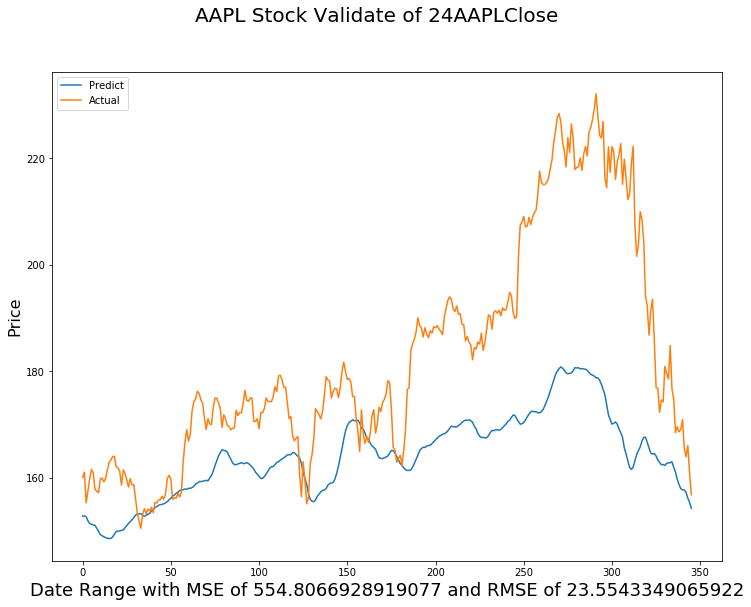

Start SVM.......
MSE_value 478.3244387648429


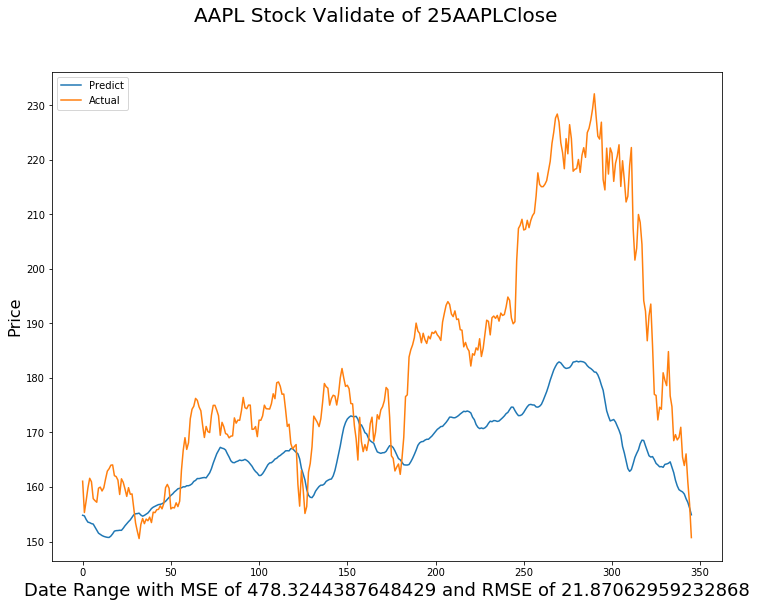

Start SVM.......
MSE_value 422.7362968852522


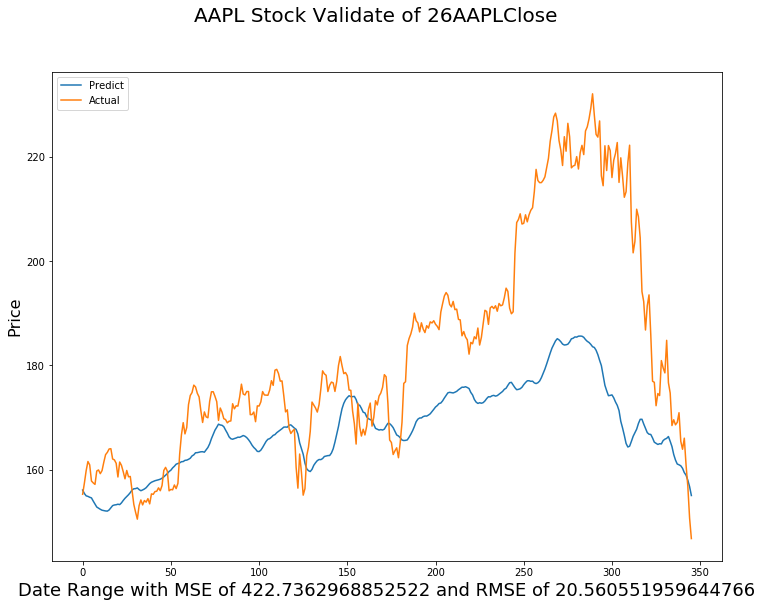

Start SVM.......
MSE_value 374.8789588794647


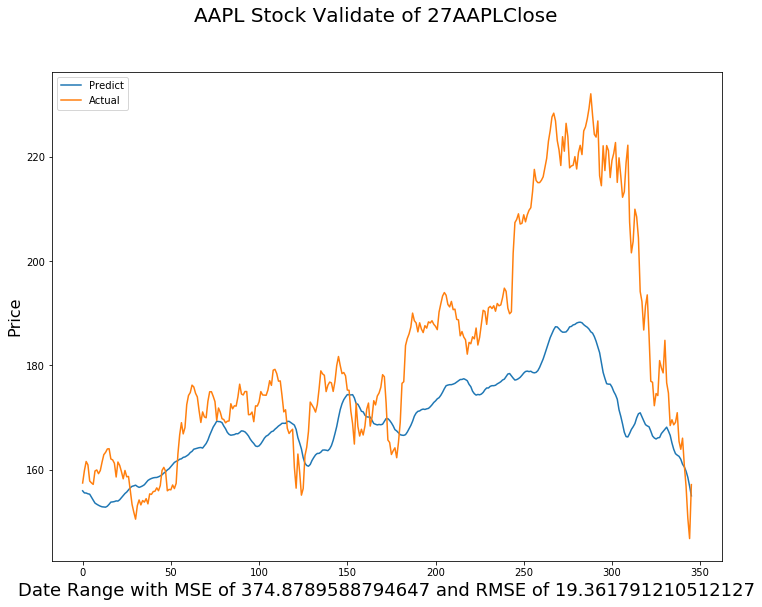

Start SVM.......
MSE_value 370.6812472255125


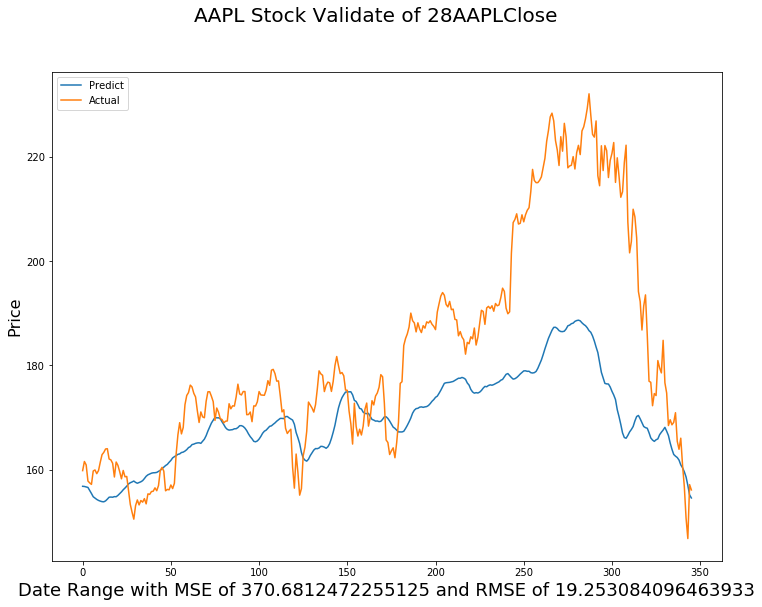

Start SVM.......
MSE_value 401.0520059796727


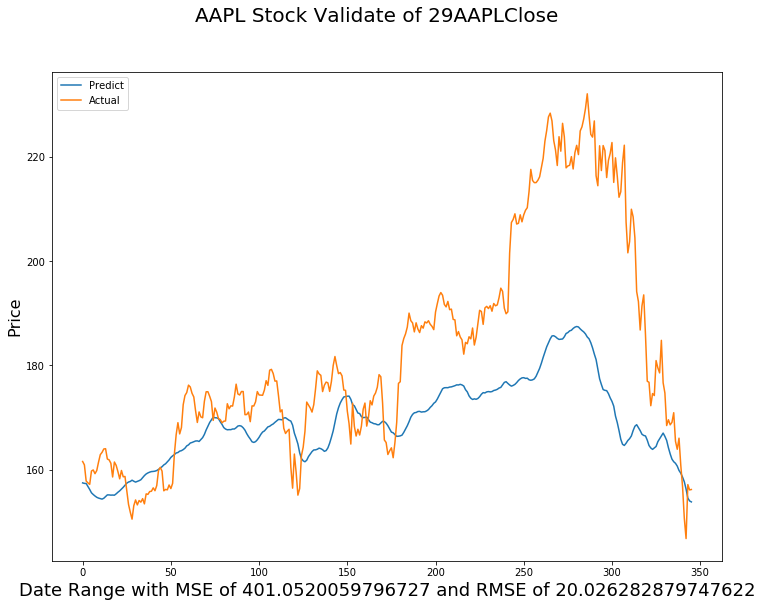

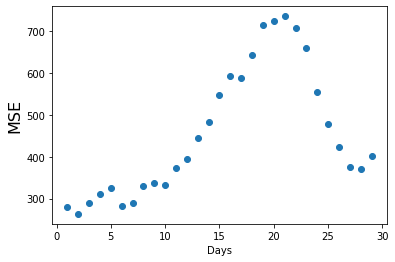

In [21]:
#Since we use a large amount of data, the training takes a bit long to train.
#One method is is dimension reduction using Principal Component Analysis
#We pick the first 50 principal components and use it to run the model.
SVM_model(use_scale=False, use_PCA=True, stock=['AAPL'], K='linear')

**Model Remark:** Using PCA would reduce the training time of the model, but it also increases the error rate. As for forecasting financial data, minimizing error is the priority, thus using PCA would not be an ideal option.

**Subsection Remark:** From the above experiments, we can conclude that it is better to use non-scaled and non-PCA data to train the SVM model, but the trade-off is that the model would take longer time to run. Also, more data is not always better, the results from the experiment with APPL tickers showed that using the previous 3 days data produces the best result. However, it also depends on which ticker; other ticker's long term historical prices might have a bigger impact on the current price. One can easily run the model above with all the stock by replacing the parameter stock with the entire stocklist, and observe any well-performing tickers.

## ii) Using previous price to predict multiple days head
We can twist the model a little to have it predict d days ahead.
$$P_{t+d} = f(Q_{1_{t}},Q_{2_{t}},Q_{3_{t}},Q_{4_{t}},Q_{5_{t}},...)$$
where $P$ is the stock to be predict, $Q$ are the related stocks and $d \in \{1,30\}$

Start!!
Start SVM.......
MSE_value 96.62034721057043


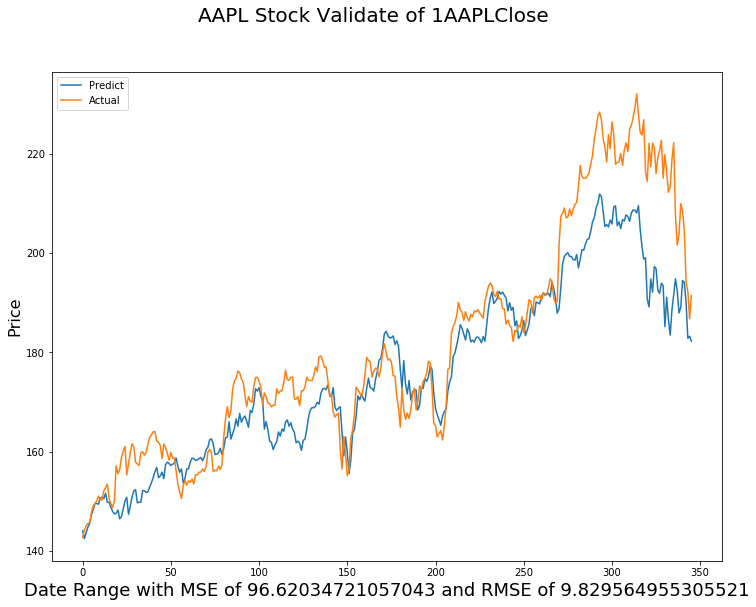

Start SVM.......
MSE_value 136.25182750239307


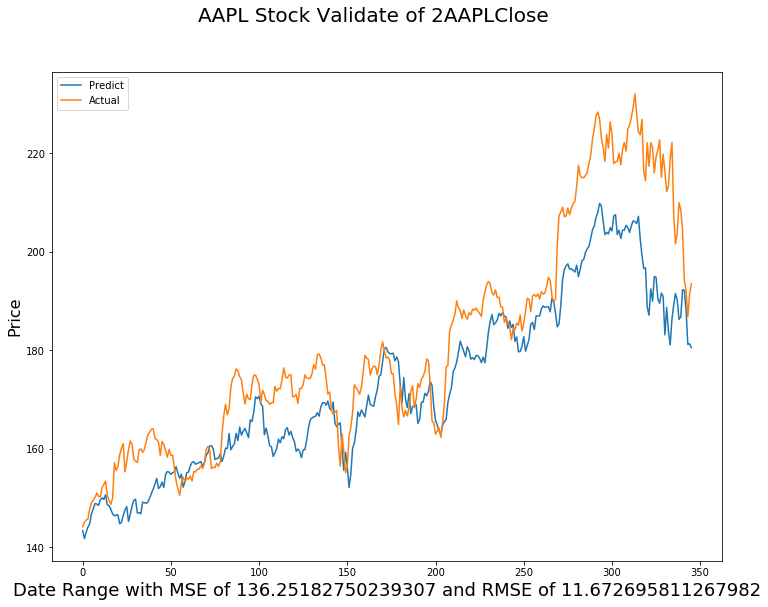

Start SVM.......
MSE_value 170.12703247191092


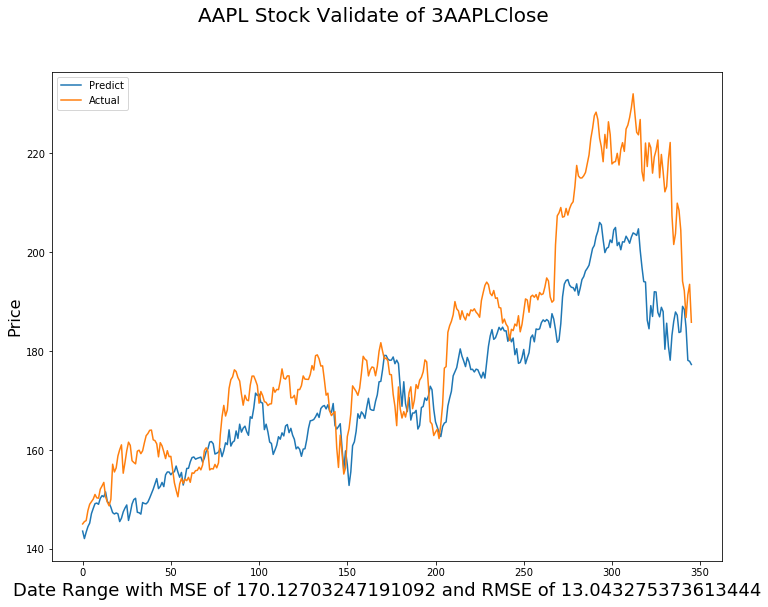

Start SVM.......
MSE_value 188.7983591408656


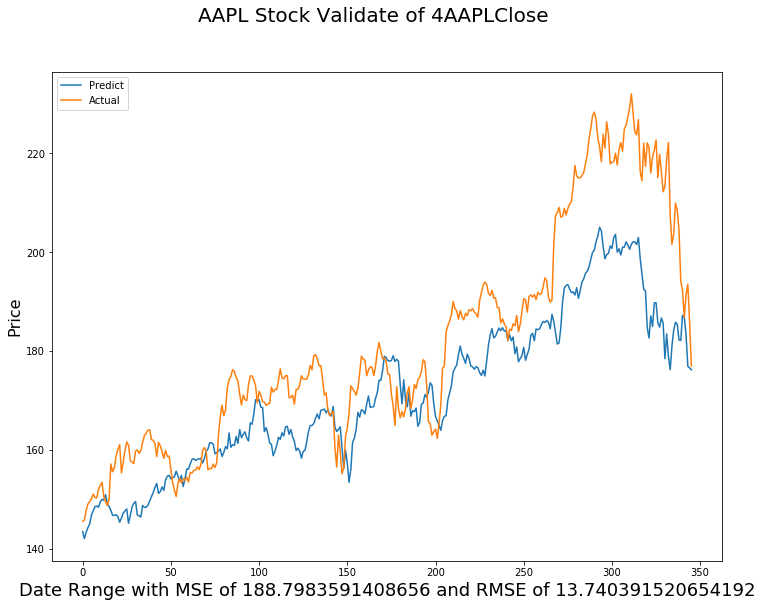

Start SVM.......
MSE_value 232.2447647940436


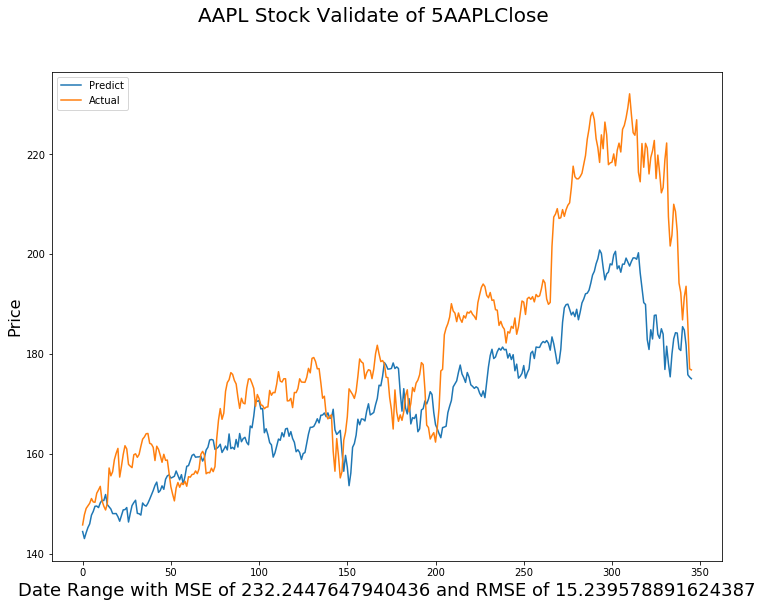

Start SVM.......
MSE_value 256.3446597831477


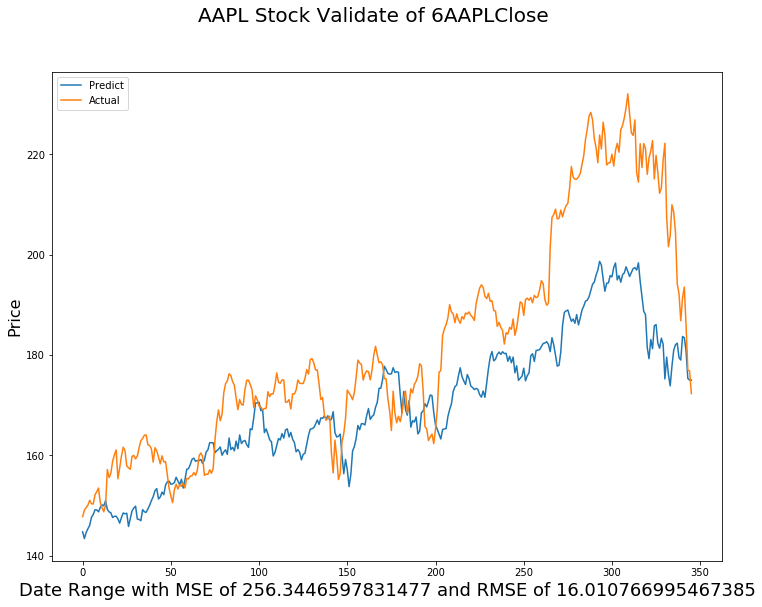

Start SVM.......
MSE_value 342.431350618273


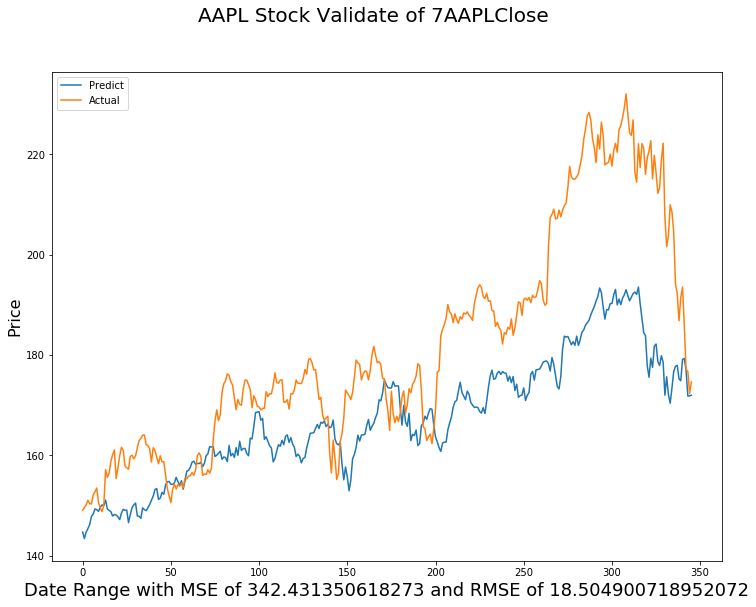

Start SVM.......
MSE_value 341.3775339625876


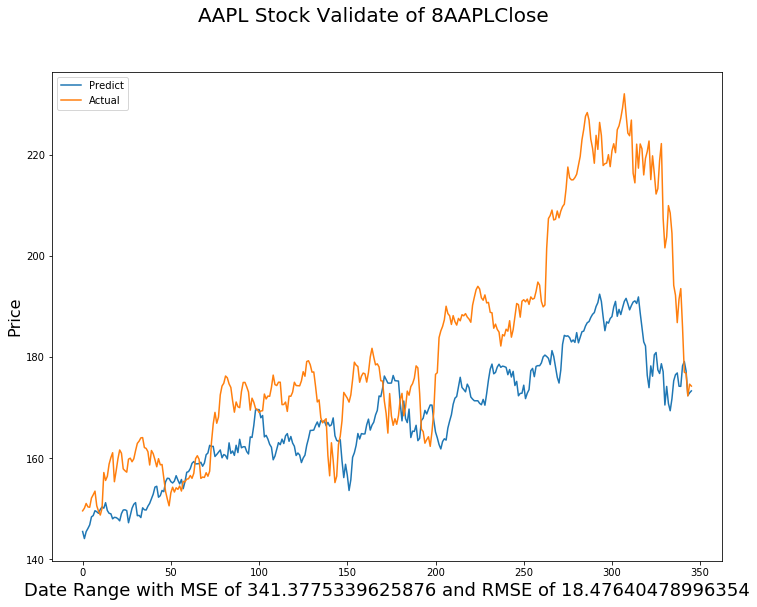

Start SVM.......
MSE_value 392.19432329113283


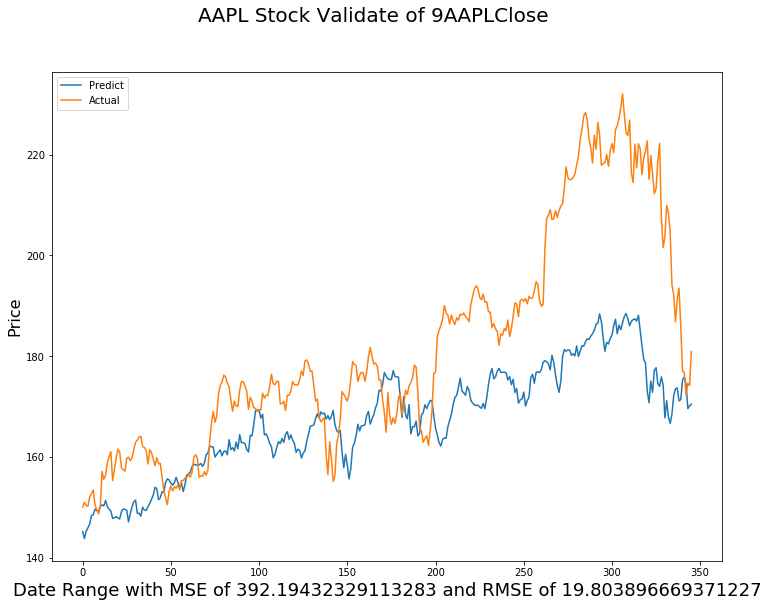

Start SVM.......
MSE_value 429.7244334483648


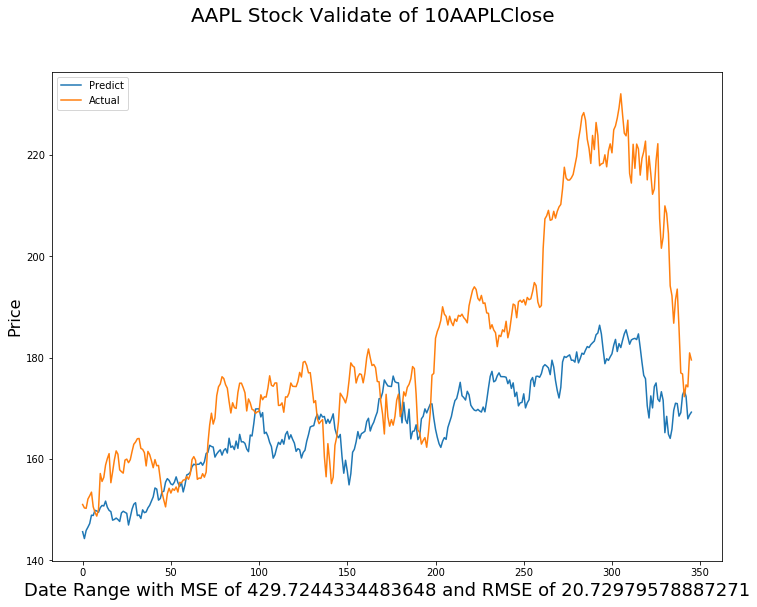

Start SVM.......
MSE_value 623.2165858107412


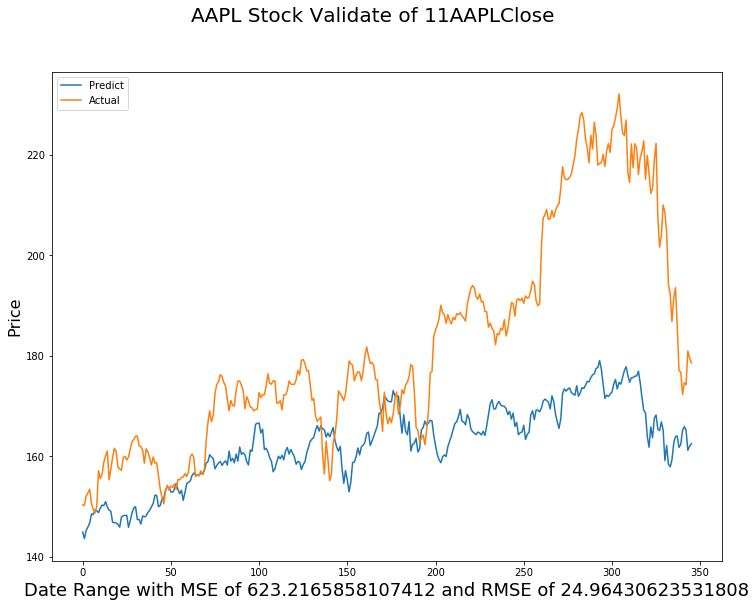

Start SVM.......
MSE_value 719.4068009695202


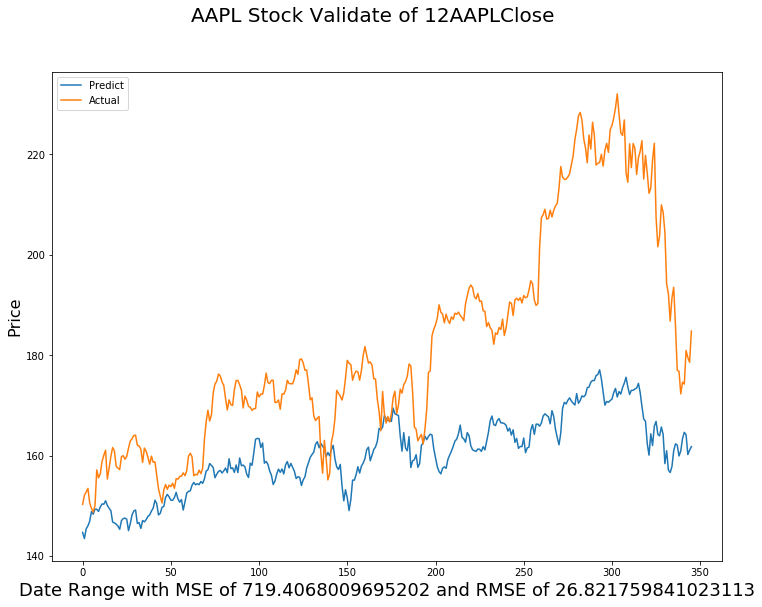

Start SVM.......
MSE_value 787.6488989030055


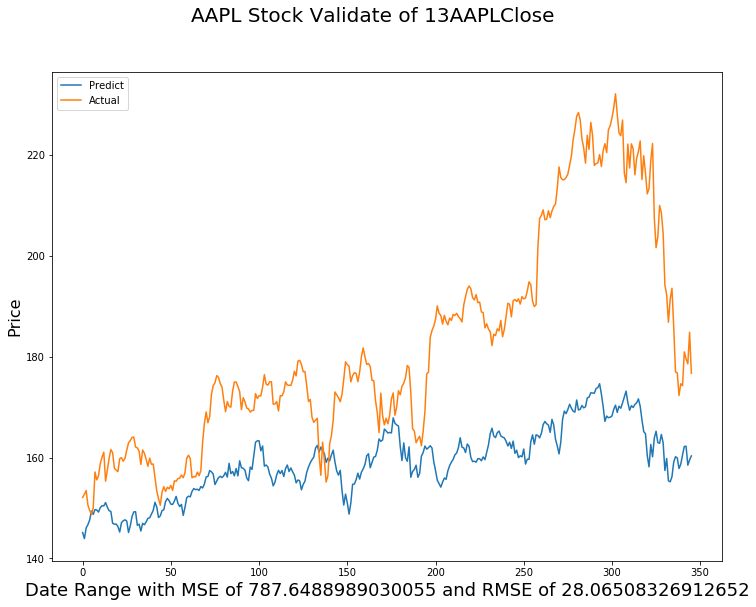

Start SVM.......
MSE_value 916.6148563264753


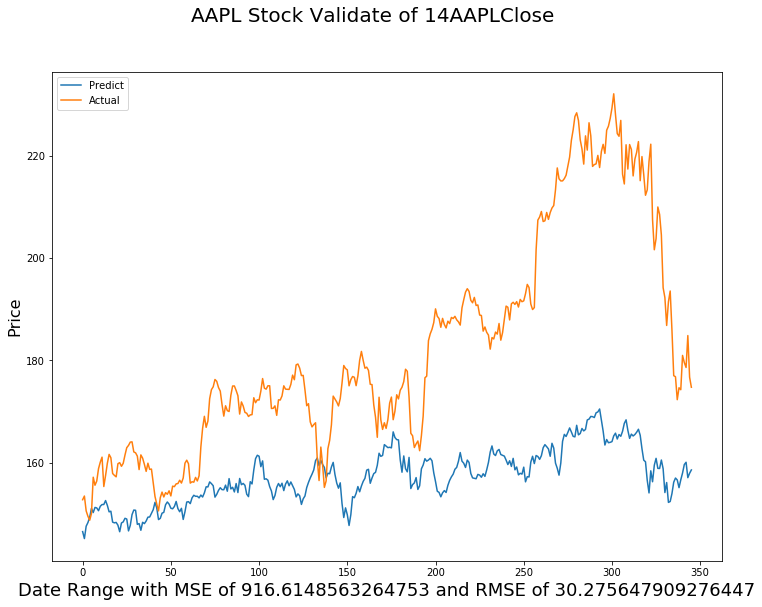

Start SVM.......
MSE_value 1068.5606883703313


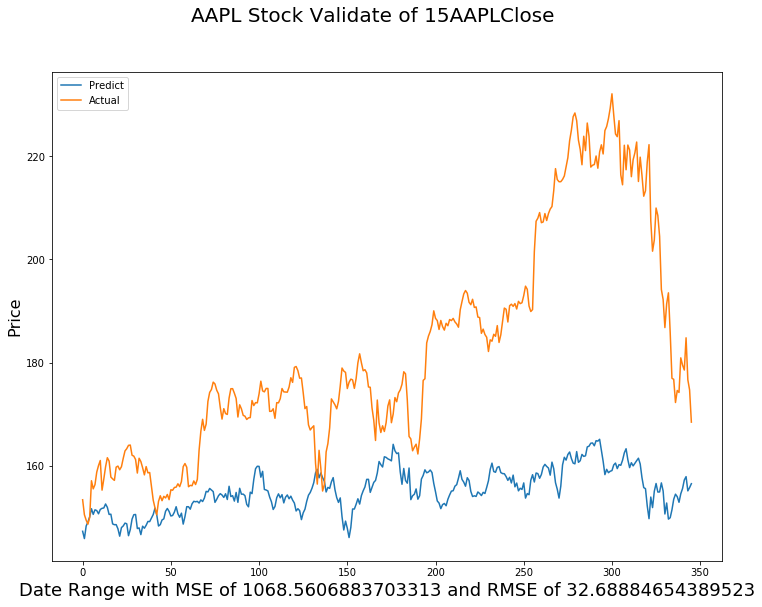

Start SVM.......
MSE_value 1326.4376229101497


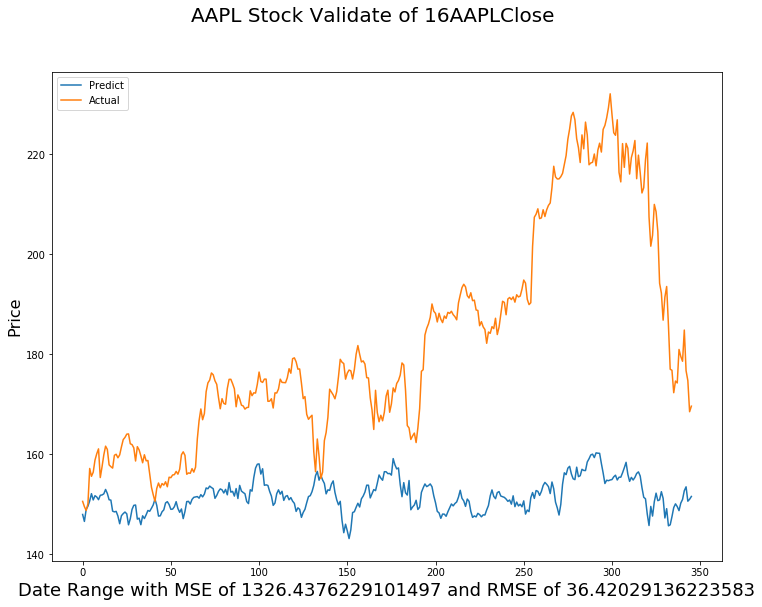

Start SVM.......
MSE_value 1521.9075037990858


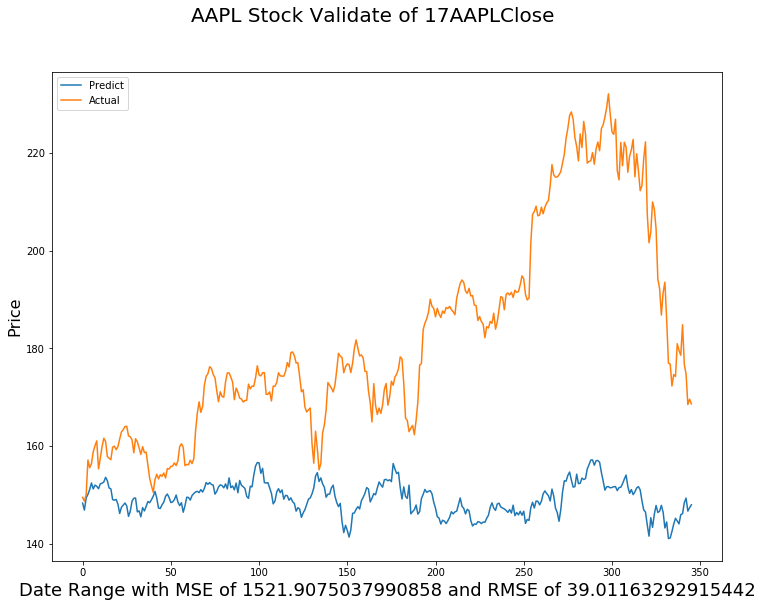

Start SVM.......
MSE_value 1785.9979764097804


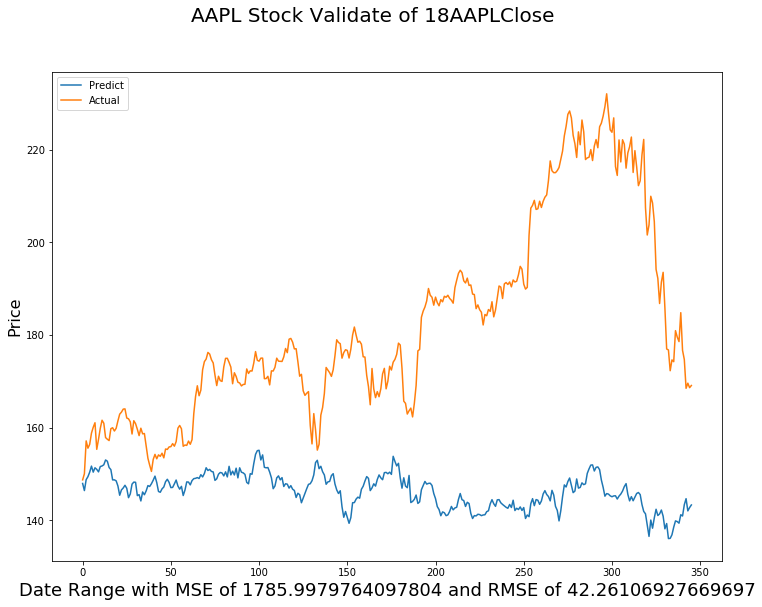

Start SVM.......
MSE_value 2025.446733018555


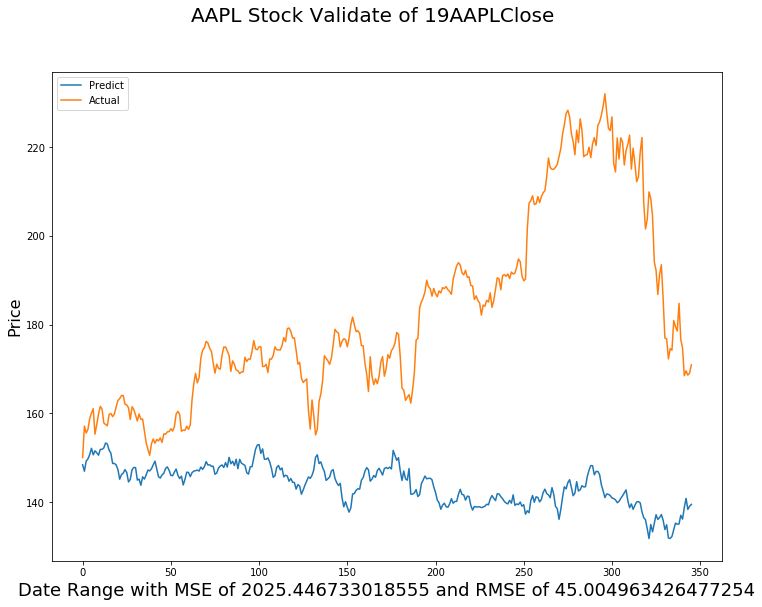

Start SVM.......
MSE_value 2473.3610806036813


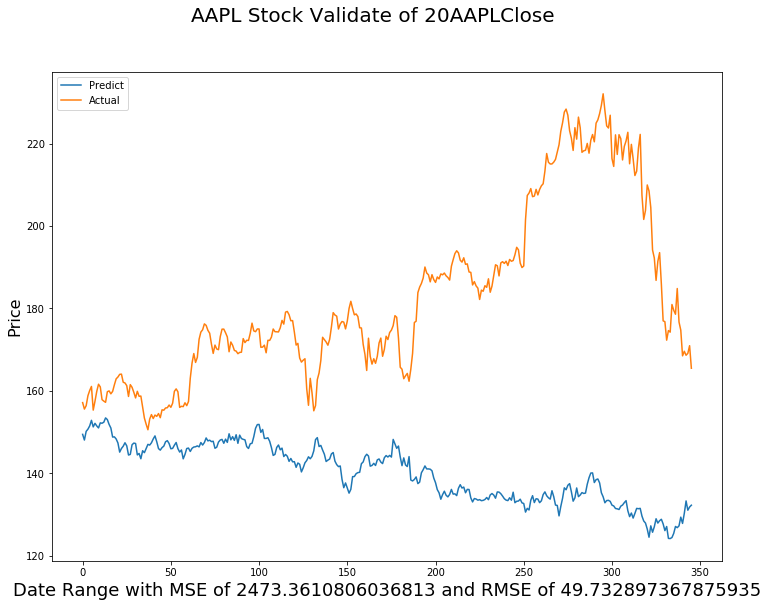

Start SVM.......
MSE_value 2442.4942584340142


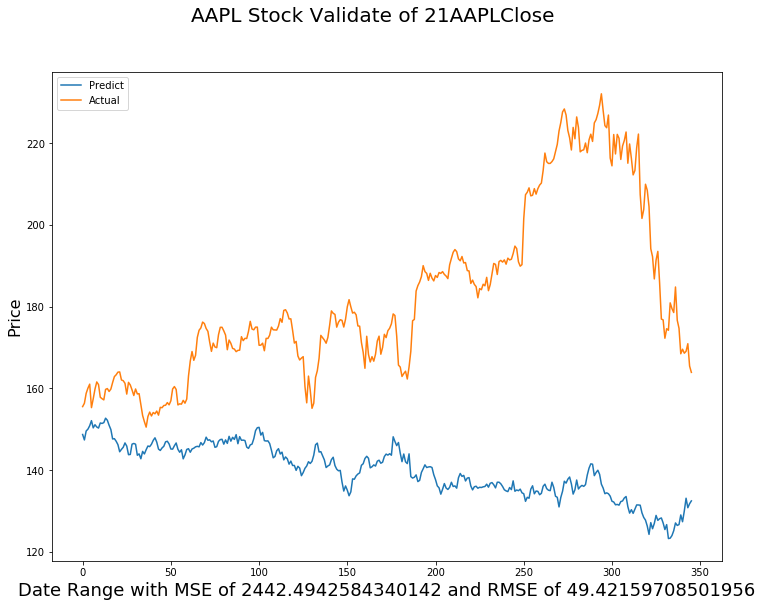

Start SVM.......
MSE_value 2635.8603463910345


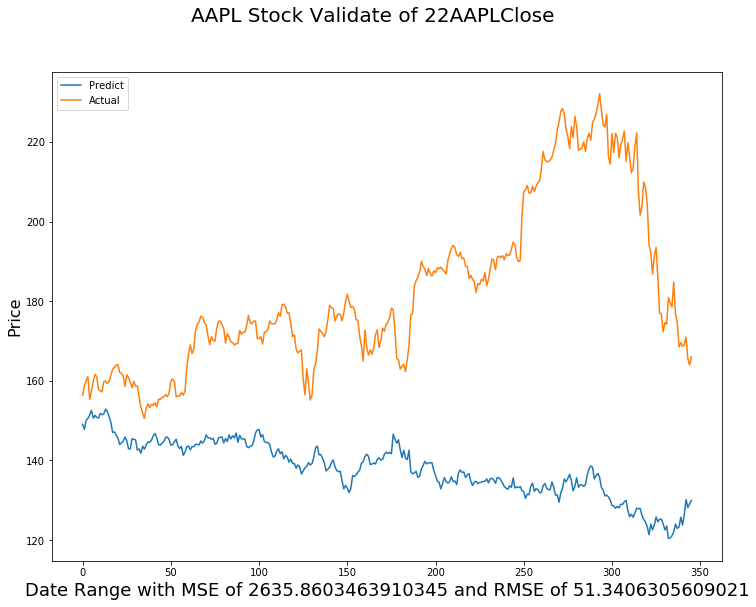

Start SVM.......
MSE_value 2543.9341354281323


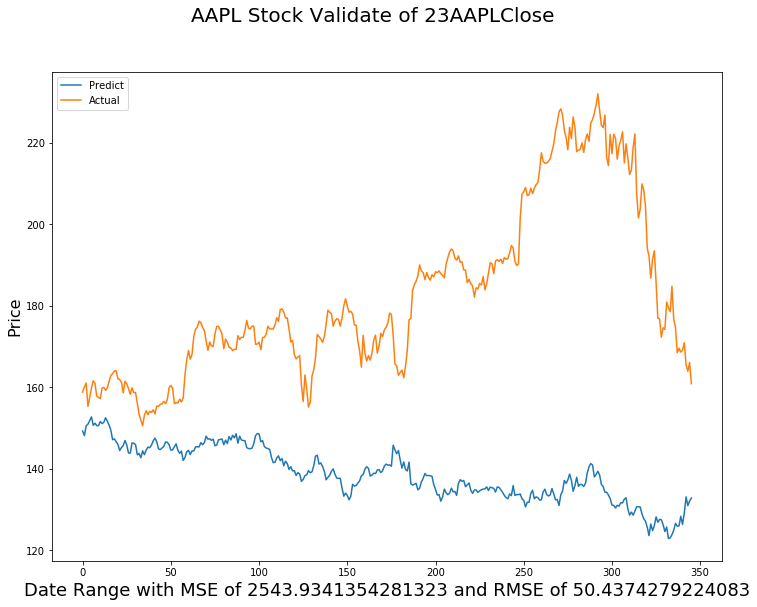

Start SVM.......
MSE_value 3005.922730935255


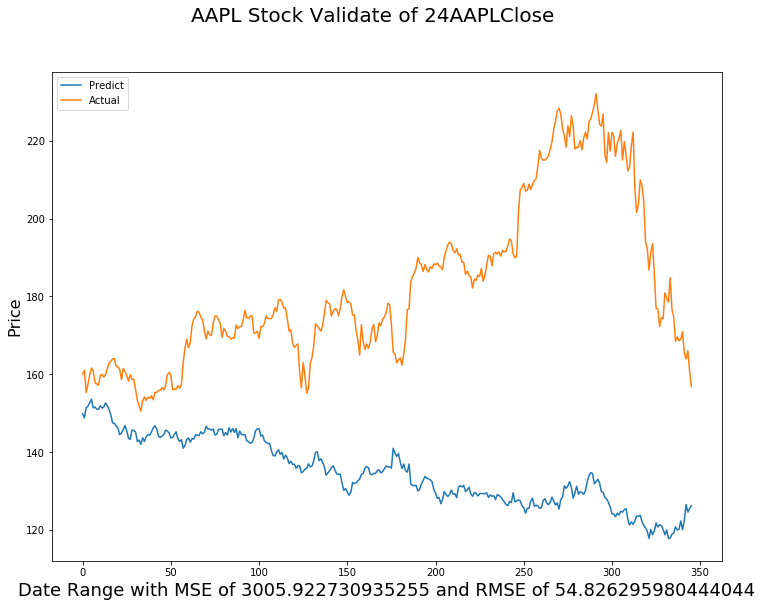

Start SVM.......
MSE_value 3412.7202681197996


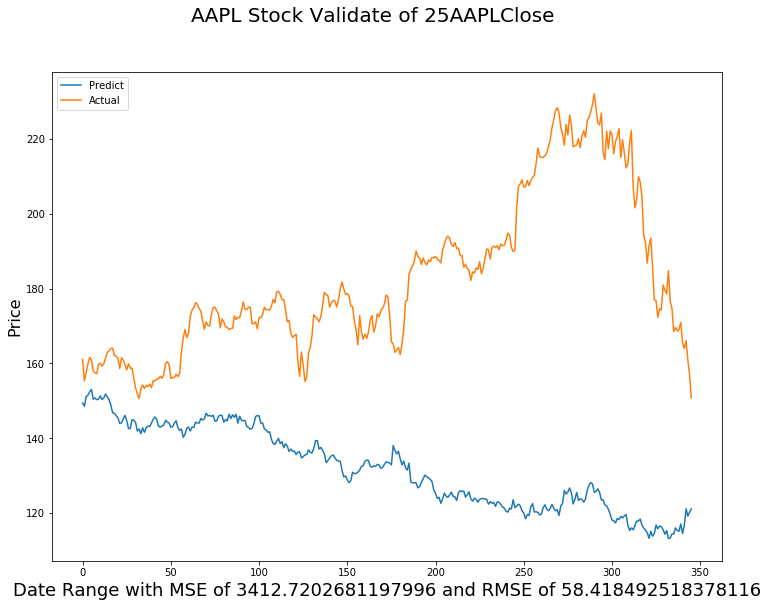

Start SVM.......
MSE_value 3522.2591888237207


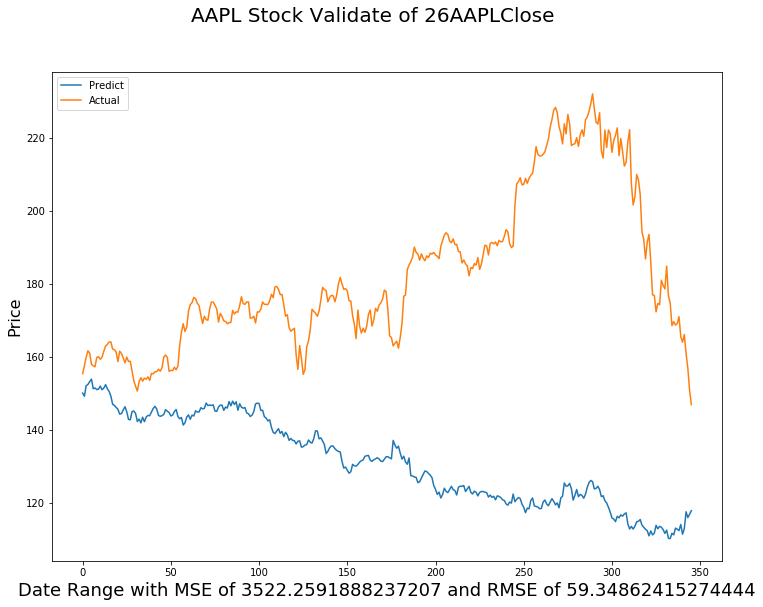

Start SVM.......
MSE_value 4081.413653333262


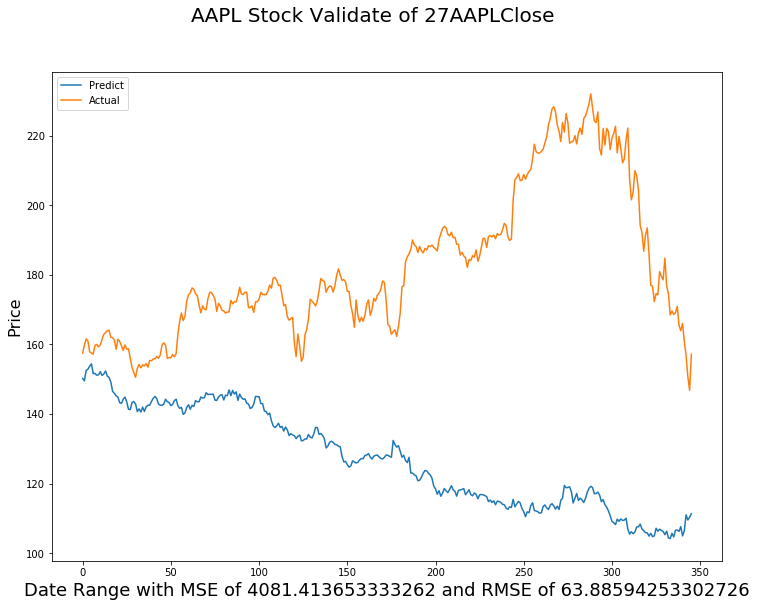

Start SVM.......
MSE_value 3836.616209814673


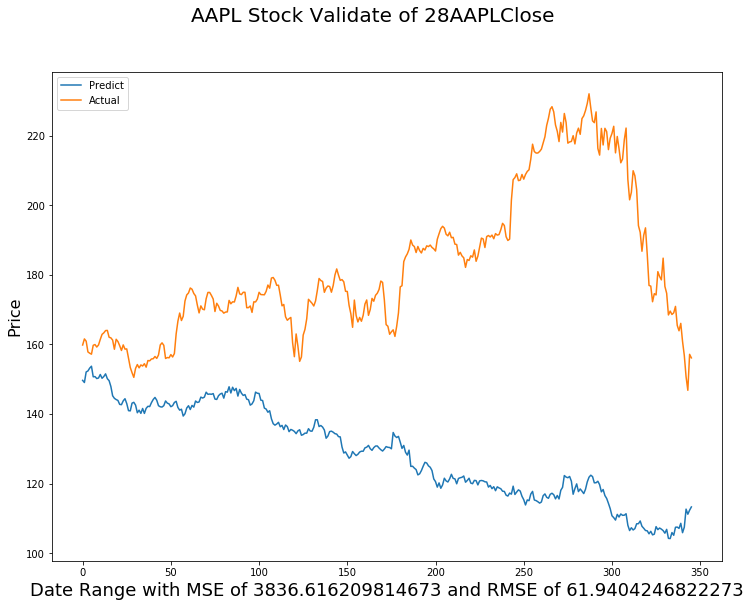

Start SVM.......
MSE_value 4005.026118325184


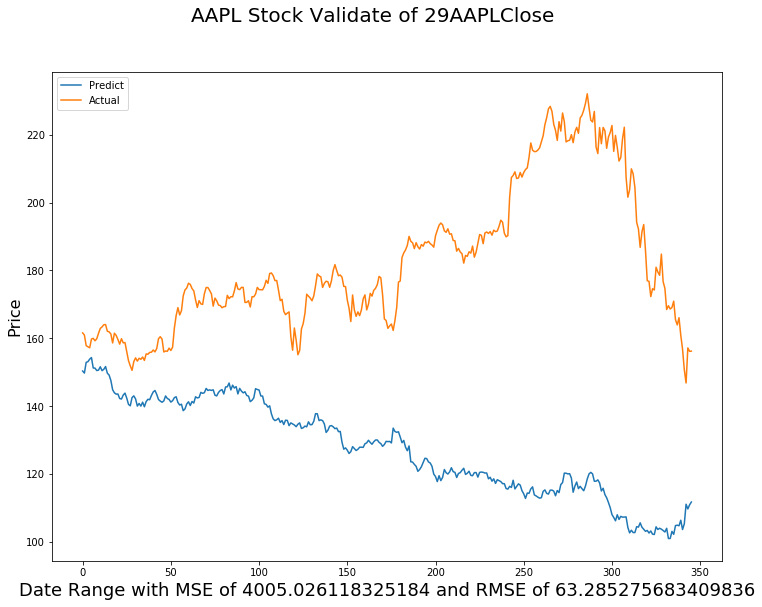

In [22]:
import pandas as pd
import os
import math
import numpy as np
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score,mean_squared_error

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
df = pd.read_csv("metastockprice.csv")
df = df[:-30]
df = df.fillna(0)
with open('stocklist.txt') as f:
    content = f.readlines()
content = [x.strip() for x in content]
resultcol = ['Days']
for stocky in ['AAPL']:
    if not os.path.exists('PlotPriceForward/{}'.format(stocky)):
        os.makedirs('PlotPriceForward/{}'.format(stocky))
    resultcol.append(stocky)
resultdf = pd.DataFrame(columns=resultcol)
print('Start!!')
MSE_list = []
for day in range(29):
    datacolums = []
    resultlist = []
    maxstock = 0
    for stocky in ['AAPL']:
        for stockx in content:
            nametmp = str(0)+str(stockx)+'Close'
            datacolums.append(nametmp)
        datacolums.append(str(day + 1) + str(stocky) + 'Close')
        tmpdf = df[datacolums]
        #######SVM######
        print("Start SVM.......")
        x = tmpdf[tmpdf.columns[:-1]]
        y = tmpdf[tmpdf.columns[-1]]
        xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, shuffle=False)
        min_max_scaler = MinMaxScaler()
        x_train = min_max_scaler.fit_transform(xtrain)
        x_test = min_max_scaler.transform(xtest)
        regressor = SVR(kernel='linear')
        regressor.fit(x_train,ytrain)
        pred_train = regressor.predict(x_train)
        pred = regressor.predict(x_test)
        MSE = mean_squared_error(ytest, pred)
        MSE_list.append(MSE)
        MSE_train = mean_squared_error(ytrain, pred_train)
        resultlist.append(math.sqrt(MSE))
        print('MSE_value',MSE)
        fig = plt.figure(figsize=(12, 9))
        fig.suptitle(
            '{} Stock Validate of {}'.format(stocky,y.name),
            fontsize=20)
        fig.suptitle(
            '{} Stock Validate of {} '.format(stocky,y.name),
            fontsize=20)
        plt.xlabel('Date Range with MSE of {} and RMSE of {}'.format(str(MSE),str(math.sqrt(MSE))), fontsize=18)
        plt.ylabel('Price', fontsize=16)
        plt.plot(pred, label='Predict')
        plt.plot(ytest.values, label='Actual')
        plt.legend(loc='upper left')
        plt.show()
        plt.close()
        datacolums = []

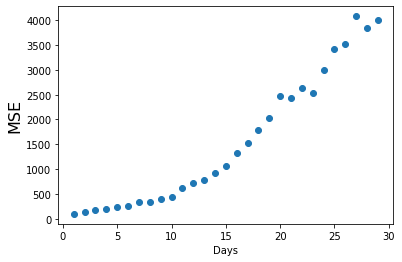

In [0]:
plt.scatter(range(1,len(MSE_list)+1), MSE_list)
plt.xlabel('Days')
plt.ylabel('MSE', fontsize=16)
plt.show()

**Model Remark:** Based on the results, we are expected that the error would incease as we try to predict futthur in the future. However, the reason we build this model is to attempt to find the trend of the stock a few days ahead instead of just predicting the next day.

# IV.Support Vector Classification
Regression is difficult because as discussed earlier, the evaluating metric of MSE is not always the best. To make the problem easier, instead of using regression, we use classification of Up and Down. First, we find the daily relative difference of the stock price and set it to be equal to 1. If the change is positive and 0 otherwise, then we run the SVC model.

## i) Use previouse stock price changes to predict the next day change.

Start!!
Start SVM....... AAPL
[[81 78]
 [94 93]]
              precision    recall  f1-score   support

         0.0       0.46      0.51      0.49       159
         1.0       0.54      0.50      0.52       187

    accuracy                           0.50       346
   macro avg       0.50      0.50      0.50       346
weighted avg       0.51      0.50      0.50       346


Testing Accuracy: 50.28901734104046
Start SVM....... AAPL
[[ 81  77]
 [102  86]]
              precision    recall  f1-score   support

         0.0       0.44      0.51      0.48       158
         1.0       0.53      0.46      0.49       188

    accuracy                           0.48       346
   macro avg       0.49      0.49      0.48       346
weighted avg       0.49      0.48      0.48       346


Testing Accuracy: 48.26589595375722
Start SVM....... AAPL
[[ 84  75]
 [105  82]]
              precision    recall  f1-score   support

         0.0       0.44      0.53      0.48       159
         1.0       0.52 

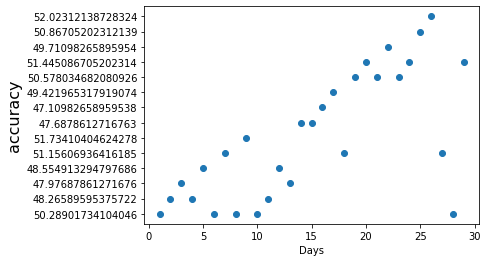

In [23]:
# coding: utf-8
import pandas as pd
import os
import math
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
df = pd.read_csv("metastockpercent.csv")
df = df[:-30]
df = df.fillna(0)
sc_S = StandardScaler()
sc_t = StandardScaler()
#print(df.shape)
with open('stocklist.txt') as f:
    content = f.readlines()
content = [x.strip() for x in content]
resultcol = ['Days']
for stocky in ['AAPL']:
    if not os.path.exists('PlotUD/{}'.format(stocky)):
        os.makedirs('PlotUD/{}'.format(stocky))
    resultcol.append(stocky)
resultdf = pd.DataFrame(columns=resultcol)
print('Start!!')
resultlist = []
for day in range(29):
    datacolums = []
    for stocky in ['AAPL']:
        for stockx in content:
            for i in range(day+1):
                nametmp = str(i)+str(stockx)+'Close'
                datacolums.append(nametmp)
        datacolums.append(str(day + 1) + str(stocky) + 'Close')
        tmpdf = df[datacolums]
        #######SVM######
        print("Start SVM.......",stocky)
        x = tmpdf[tmpdf.columns[:-1]].copy()
        y = (tmpdf[tmpdf.columns[-1]]).copy() #convert to -1 or 1
        x[x >= 0] = 1
        x[x < 0] = 0
        y[y>=0] = 1
        y[y<0] = 0
        x_train, x_test, ytrain, ytest = train_test_split(x, y, test_size=0.2, shuffle=False)
        min_max_scaler = MinMaxScaler()
        x_train = min_max_scaler.fit_transform(x_train)
        x_test = min_max_scaler.transform(x_test)
        regressor = SVC(kernel='linear')
        regressor.fit(x_train,ytrain)
        pred_train = regressor.predict(x_train)
        pred = regressor.predict(x_test)
        print(confusion_matrix(ytest, pred))
        print(classification_report(ytest, pred))
        accuracy = str(np.mean((pred == ytest) * 100))
        print('\nTesting Accuracy: ' + accuracy)
        resultlist.append(accuracy)
plt.scatter(range(1,len(resultlist)+1), resultlist)
plt.xlabel('Days')
plt.ylabel('accuracy', fontsize=16)
plt.show()

# V. Conclusion
Based on all the experiments above, we can conclude that the SVM methods need to be furthur investigated in order to outperform ARIMA models. Forecasting stock market has been studied for many decades, and it is still a challenging problem. Financial time series is non-stationary, and usually good performing methods are kept hidden from public and is not published. For future research, we would like to carefully design the features and design a better model architecture. More modern machine learning methods can be employed such as feedforward fully connected neural network or use NLP to incoporate news into stock prediction. 